# Exploratory Data Analysis for Engine Removal Forecast
This notebook explores and analyzes engine sensor data for engine removal forecast. The workflow includes data loading, cleaning, visualization, outlier detection, anomaly detection, trend/seasonality analysis, and dimensionality reduction.

## 1. Import Required Libraries
Import all necessary libraries for data manipulation, visualization, and analysis.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings('ignore')

# Time series libraries
import statsmodels.api as sm
import ruptures as rpt
from scipy.signal import find_peaks


## 2. Data Loading
Load the cleaned engine data from CSV.

In [2]:
#df = pd.read_csv('Data/engines_data_cleaned.csv', parse_dates=['flight_datetime_c'])  # Ensure datetime parsing
df = pd.read_csv('Data/LEAB_engines_data_cleaned.csv', parse_dates=['flight_datetime_c'])  # Ensure datetime parsing
# Display the first few rows of the dataframe
df.head()


,aircraft_id,eposition,esn,flight_phase,eng_type,eng_install_date,cycles,fuel_flw,oil_temp,egt_divergence_,...,core_spd,core_spd_divergence,pt2_(fan_inlet_tot_pres),egt_probe_average,eng_number,flight_datetime_c,date,time,flight_cycle,RCL
0,AIRCRAFT1,1.0,ESN1,TAKEOFF,LEAP-1A26E1,16-01-23 23:00,2.0,1762.0,79.3,-8.95,...,105.28,0.060,14.93,865.2875,ESN1,2023-01-17 07:28:00,2023-01-17,07:28:00,1,4107
1,AIRCRAFT1,1.0,ESN1,CLIMB,LEAP-1A26E1,16-01-23 23:00,3.0,5327.0,84.5,-10.55,...,105.48,0.085,9.36,844.4625,ESN1,2023-01-17 07:28:00,2023-01-17,07:28:00,1,4107
2,AIRCRAFT1,1.0,ESN1,CRUISE,LEAP-1A26E1,16-01-23 23:00,3.0,2490.0,91.0,-8.60,...,101.89,0.095,5.17,752.6250,ESN1,2023-01-17 08:37:00,2023-01-17,08:37:00,1,4107
3,AIRCRAFT1,1.0,ESN1,TAKEOFF,LEAP-1A26E1,16-01-23 23:00,3.0,3252.0,88.7,-10.90,...,108.06,0.110,15.30,916.7125,ESN1,2023-01-17 14:13:00,2023-01-17,14:13:00,2,4106
4,AIRCRAFT1,1.0,ESN1,CLIMB,LEAP-1A26E1,16-01-23 23:00,4.0,4954.0,93.5,-9.60,...,106.40,0.100,10.01,849.0375,ESN1,2023-01-17 14:13:00,2023-01-17,14:13:00,2,4106


## 3. Data Overview
Display basic information, statistics, and unique engine counts.

In [3]:
# Display information about the dataframe
df.info()

# Display descriptive statistics
df.describe()

# Count the number of unique engine IDs
print(f"\n \n Number of engines in this Dataset: {df['esn'].nunique()}")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 248132 entries, 0 to 248131
Data columns (total 23 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   aircraft_id               248132 non-null  object        
 1   eposition                 248132 non-null  float64       
 2   esn                       248132 non-null  object        
 3   flight_phase              248132 non-null  object        
 4   eng_type                  248132 non-null  object        
 5   eng_install_date          248132 non-null  object        
 6   cycles                    248130 non-null  float64       
 7   fuel_flw                  248019 non-null  float64       
 8   oil_temp                  248060 non-null  float64       
 9   egt_divergence_           247905 non-null  float64       
 10  ps3_divergence            247918 non-null  float64       
 11  oil_pres                  248060 non-null  float64       
 12  oi

## 4. Flight Phase Distribution
Check the distribution of flight phases in the dataset.

In [4]:
# Count the occurrences of each flight phase
df['flight_phase'].value_counts()

flight_phase
CRUISE     112005
TAKEOFF     70280
CLIMB       65847
Name: count, dtype: int64

## 5. Missing Value Analysis
Identify and handle missing values in the dataset.

In [1]:
# Handle missing values (check for NaNs)
df.isna().sum()

NameError: name 'df' is not defined

In [6]:
(df.isna().sum() / len(df)) * 100

aircraft_id                  0.000000
eposition                    0.000000
esn                          0.000000
flight_phase                 0.000000
eng_type                     0.000000
eng_install_date             0.000000
cycles                       0.000806
fuel_flw                     0.045540
oil_temp                     0.029017
egt_divergence_              0.091484
ps3_divergence               0.086244
oil_pres                     0.029017
oil_pres_divergence         26.576983
core_spd                     0.029823
core_spd_divergence          0.086647
pt2_(fan_inlet_tot_pres)     0.030226
egt_probe_average            0.050376
eng_number                   0.000000
flight_datetime_c            0.000000
date                         0.000000
time                         0.000000
flight_cycle                 0.000000
RCL                          0.000000
dtype: float64

## 7. Combined Dataset (LEAP-1A26 + LEAP-1A26E1)

Both LEAP-1A26 variants are kept (49 engines total). `df_combined` is the alias used downstream; `eng_type` is preserved as a categorical feature.


In [ ]:
# Combined dataset: keep both LEAP-1A26 and LEAP-1A26E1 (49 engines)
df_combined = df.copy()
print(f"Engines per type: {df_combined.groupby('eng_type')['esn'].nunique().to_dict()}")
print(f"Total engines: {df_combined['esn'].nunique()}")
print(f"Total rows: {len(df_combined)}")


## 9. Outlier Detection
Detect and remove outliers using the Z-score method.

In [ ]:
# Outlier detection (Z-score) on the combined dataset.
# Threshold |z|<3 was validated against the 49-engine set: removes ~3.1% of records
# (vs. 9.85% on the smaller E1-only subset where thresholds were over-tight).
from scipy.stats import zscore
numerical_features = ['egt_probe_average', 'fuel_flw', 'core_spd', 'oil_temp', 'oil_pres', 'pt2_(fan_inlet_tot_pres)']
z_scores = df_combined[numerical_features].apply(zscore, nan_policy='omit').abs()
outliers = (z_scores > 3).any(axis=1)
df_combined_no_outliers = df_combined.loc[~outliers].copy()
print(f"Engines after outlier removal: {df_combined_no_outliers['esn'].nunique()}")
print(f"Engines per type: {df_combined_no_outliers.groupby('eng_type')['esn'].nunique().to_dict()}")
removed_percentage = (df_combined.shape[0] - df_combined_no_outliers.shape[0]) / df_combined.shape[0] * 100
print(f"Percentage of records removed: {removed_percentage:.2f}%")


## 6. Impute Missing Values
Use linear interpolation to fill missing values for selected features.

In [70]:
# Optimize missing value imputation using vectorized operations
feature_impute = ['egt_probe_average', 'fuel_flw', 'core_spd','oil_temp','oil_pres','pt2_(fan_inlet_tot_pres)']
df_combined_no_outliers[feature_impute] = df_combined_no_outliers[feature_impute].interpolate(method='linear', limit_direction='both', axis=0)

In [71]:
# Check if there are still any missing values
df_combined_no_outliers.isna().sum()

aircraft_id                     0
eposition                       0
esn                             0
flight_phase                    0
eng_type                        0
eng_install_date                0
cycles                          0
fuel_flw                        0
oil_temp                        0
egt_divergence_               217
ps3_divergence                207
oil_pres                        0
oil_pres_divergence         65447
core_spd                        0
core_spd_divergence           207
pt2_(fan_inlet_tot_pres)        0
egt_probe_average               0
eng_number                      0
flight_datetime_c               0
date                            0
time                            0
flight_cycle                    0
RCL                             0
dtype: int64

In [73]:
# Check which flight phases have missing values of Core Speed
df_combined_no_outliers[df_combined_no_outliers['core_spd'].isna()]['flight_phase'].value_counts()

Series([], Name: count, dtype: int64)

In [74]:
# Use linear interpolation to fill missing values of corrected_fan_spd for the TAKEOFF phase only
df_combined_no_outliers.loc[df_combined_no_outliers['flight_phase'] == 'TAKEOFF', 'core_spd'] = df_combined_no_outliers.loc[df_combined_no_outliers['flight_phase'] == 'TAKEOFF', 'core_spd'].interpolate(method='linear', limit_direction='both')

In [76]:
# Check which flight phases have missing values of corrected_fan_spd
df_combined_no_outliers[df_combined_no_outliers['core_spd'].isna()]['flight_phase'].value_counts()

Series([], Name: count, dtype: int64)

## 7. Engine Life Analysis
Analyze the life of each engine in terms of flight cycles.

In [77]:
# Print life of each engine in flight_cycle
max_life = df.groupby(['esn', 'eng_type'])['flight_cycle'].max().reset_index()
max_life.columns = ['esn', 'eng_type', 'life in flight cycle']
print(max_life)

      esn     eng_type  life in flight cycle
0    ESN1  LEAP-1A26E1                  4108
1   ESN10  LEAP-1A26E1                  5936
2   ESN11  LEAP-1A26E1                  4778
3   ESN12  LEAP-1A26E1                  4547
4   ESN13  LEAP-1A26E1                  5138
5   ESN14  LEAP-1A26E1                  6005
6   ESN15  LEAP-1A26E1                  5231
7    ESN2  LEAP-1A26E1                  3505
8    ESN3  LEAP-1A26E1                  4216
9    ESN4  LEAP-1A26E1                  5645
10   ESN5  LEAP-1A26E1                   519
11   ESN6  LEAP-1A26E1                  4918
12   ESN7  LEAP-1A26E1                  4563
13   ESN8  LEAP-1A26E1                  5199
14   ESN9  LEAP-1A26E1                  5972


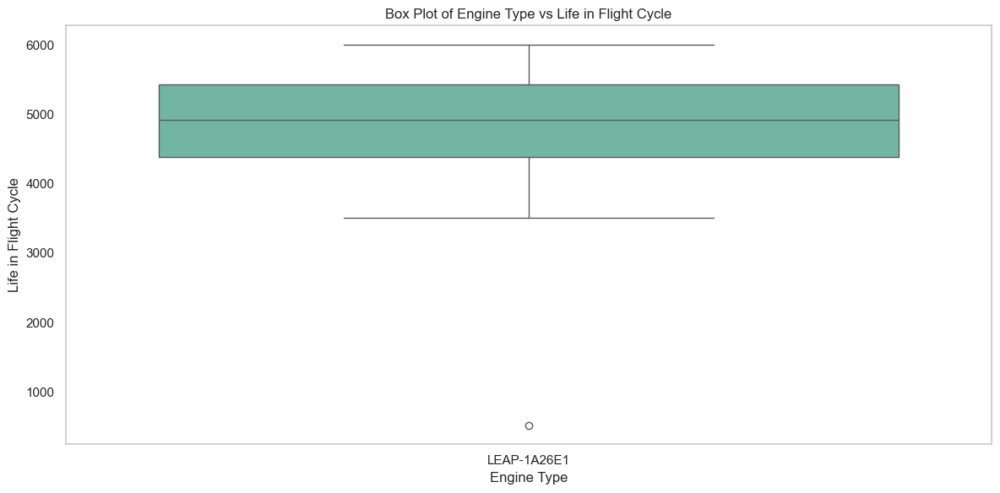

In [78]:
# a box plot of type 1 and type 2 engines and life in flight cycle
plt.figure(figsize=(12, 6))
sns.boxplot(x='eng_type', y='life in flight cycle', data=max_life, palette='Set2')
plt.title('Box Plot of Engine Type vs Life in Flight Cycle')
plt.xlabel('Engine Type')
plt.ylabel('Life in Flight Cycle')
plt.xticks()
plt.grid(axis='y')
plt.tight_layout()
plt.show()


## 10. Save Cleaned Data
Save the cleaned data without outliers for further analysis.

In [79]:
# save dataframe without outliers to a new CSV file
df_combined_no_outliers.to_csv('Data/LEAP_Engine_Data_Masked_Final_no_outliers.csv', index=False)

In [80]:
df_combined_no_outliers.head()

,aircraft_id,eposition,esn,flight_phase,eng_type,eng_install_date,cycles,fuel_flw,oil_temp,egt_divergence_,...,core_spd,core_spd_divergence,pt2_(fan_inlet_tot_pres),egt_probe_average,eng_number,flight_datetime_c,date,time,flight_cycle,RCL
0,AIRCRAFT1,1.0,ESN1,TAKEOFF,LEAP-1A26E1,16-01-23 23:00,2.0,1762.0,79.3,-8.95,...,105.28,0.060,14.93,865.2875,ESN1,2023-01-17 07:28:00,2023-01-17,07:28:00,1,4107
1,AIRCRAFT1,1.0,ESN1,CLIMB,LEAP-1A26E1,16-01-23 23:00,3.0,5327.0,84.5,-10.55,...,105.48,0.085,9.36,844.4625,ESN1,2023-01-17 07:28:00,2023-01-17,07:28:00,1,4107
2,AIRCRAFT1,1.0,ESN1,CRUISE,LEAP-1A26E1,16-01-23 23:00,3.0,2490.0,91.0,-8.60,...,101.89,0.095,5.17,752.6250,ESN1,2023-01-17 08:37:00,2023-01-17,08:37:00,1,4107
3,AIRCRAFT1,1.0,ESN1,TAKEOFF,LEAP-1A26E1,16-01-23 23:00,3.0,3252.0,88.7,-10.90,...,108.06,0.110,15.30,916.7125,ESN1,2023-01-17 14:13:00,2023-01-17,14:13:00,2,4106
4,AIRCRAFT1,1.0,ESN1,CLIMB,LEAP-1A26E1,16-01-23 23:00,4.0,4954.0,93.5,-9.60,...,106.40,0.100,10.01,849.0375,ESN1,2023-01-17 14:13:00,2023-01-17,14:13:00,2,4106


## 11. Visualize Engine Data
Visualize EGT and fuel flow for a selected engine and flight cycles.

<Figure size 1200x600 with 0 Axes>

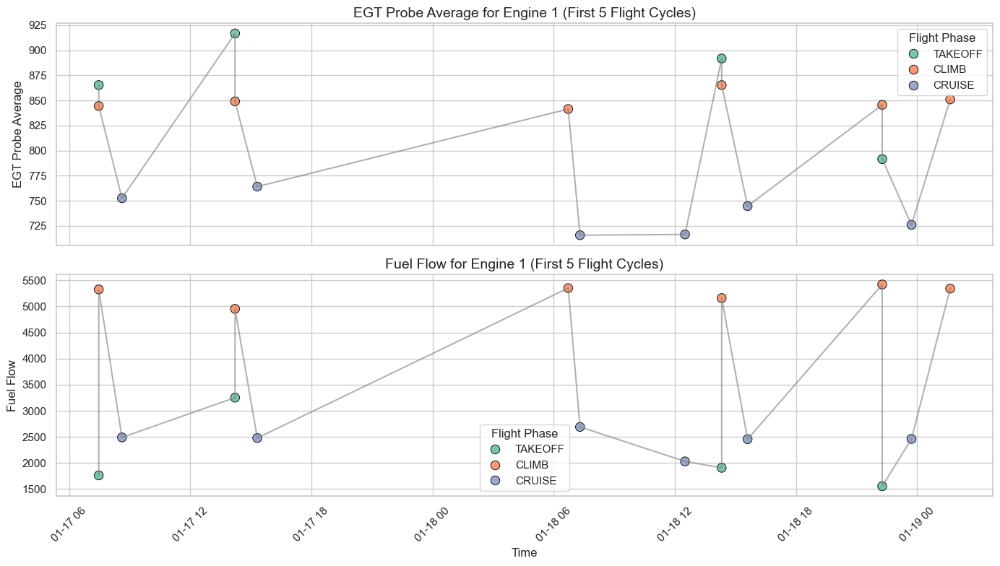

In [81]:
# Pick a single engine (any ESN) and inspect its first few flight cycles
esn = "ESN1"
df_engine1 = df_combined_no_outliers[df_combined_no_outliers['esn'] == esn].copy()

# Get the data corresponding to the first 5 flight cycles
first_5_cycles = df_engine1[df_engine1['flight_cycle'] <= 5]

# Plot EGT and fuel flow for the first 5 flight cycles
plt.figure(figsize=(12, 6))

# Sort by flight_datetime_c to ensure correct line connection
df_engine = first_5_cycles.sort_values(by="flight_datetime_c")

sns.set(style="whitegrid", palette="Set2")  # Use a consistent color palette
fig, axes = plt.subplots(2, 1, figsize=(14, 8), sharex=True)

# 1️⃣ EGT Probe Average
sns.scatterplot(
    data=df_engine, x="flight_datetime_c", y="egt_probe_average", hue="flight_phase",
    ax=axes[0], s=80, edgecolor="black", alpha=0.9, legend=True  # Ensure legend is shown
)
axes[0].plot(df_engine["flight_datetime_c"], df_engine["egt_probe_average"], color="gray", linewidth=1.5, alpha=0.6)
axes[0].set_title(f"EGT Probe Average for {esn} (First 5 Flight Cycles)", fontsize=14)
axes[0].set_ylabel("EGT Probe Average")
axes[0].set_xlabel("")
axes[0].legend(title="Flight Phase")

# 2️⃣ Fuel Flow
sns.scatterplot(
    data=df_engine, x="flight_datetime_c", y="fuel_flw", hue="flight_phase",
    ax=axes[1], s=80, edgecolor="black", alpha=0.9, legend=True
)
axes[1].plot(df_engine["flight_datetime_c"], df_engine["fuel_flw"], color="gray", linewidth=1.5, alpha=0.6)
axes[1].set_title(f"Fuel Flow for {esn} (First 5 Flight Cycles)", fontsize=14)
axes[1].set_ylabel("Fuel Flow")
axes[1].set_xlabel("Time")
axes[1].legend(title="Flight Phase")

# Beautify the x-axis
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


You should see a logical phase progression: takeoff → climb → cruise then repeat if multiple flights

## 12. Feature Distributions by Flight Phase
Plot the distribution of numerical features by flight phase, before and after outlier removal.

In [83]:
def plot_feature_distribution_by_phase(df, features, phase_col='flight_phase', title_prefix='Distribution of'):
    for feature in features:
        plt.figure(figsize=(10, 4))
        sns.histplot(
            data=df,
            x=feature,
            hue=phase_col,
            kde=True,
            element='step',
            stat='density',
            common_norm=False
        )
        plt.title(f'{title_prefix} {feature} by Flight Phase')
        plt.xlabel(feature)
        plt.ylabel('Density')
        plt.tight_layout()
        plt.show()

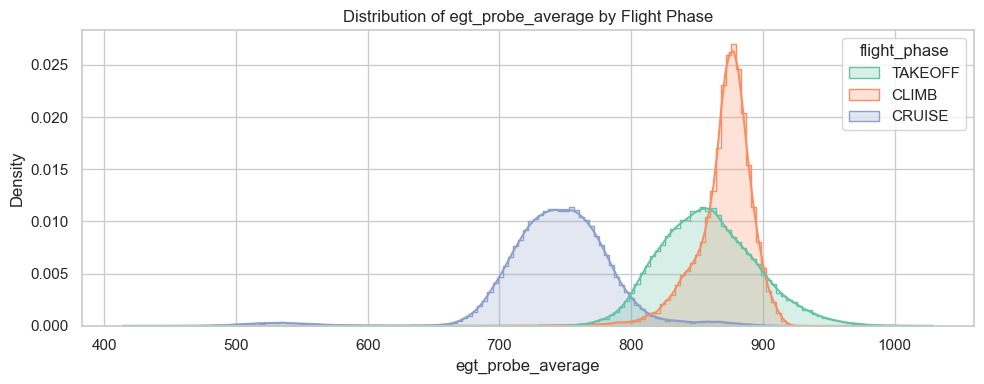

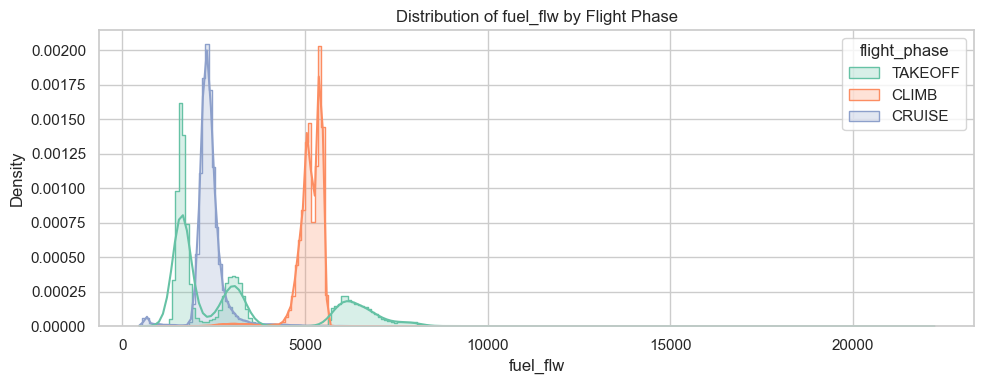

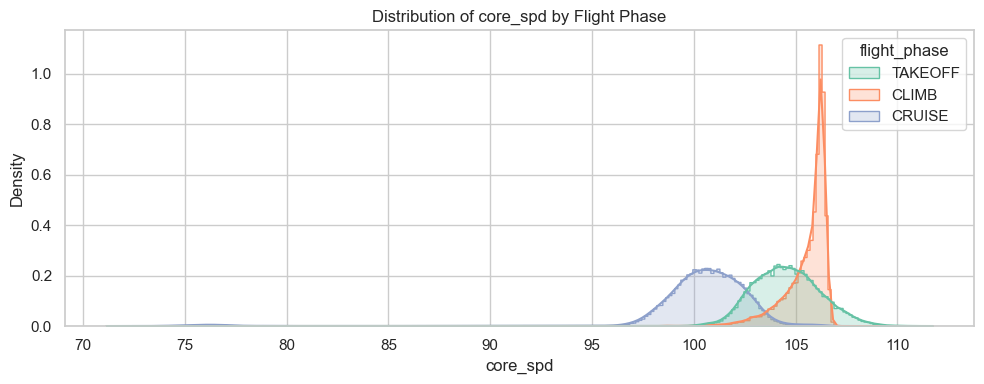

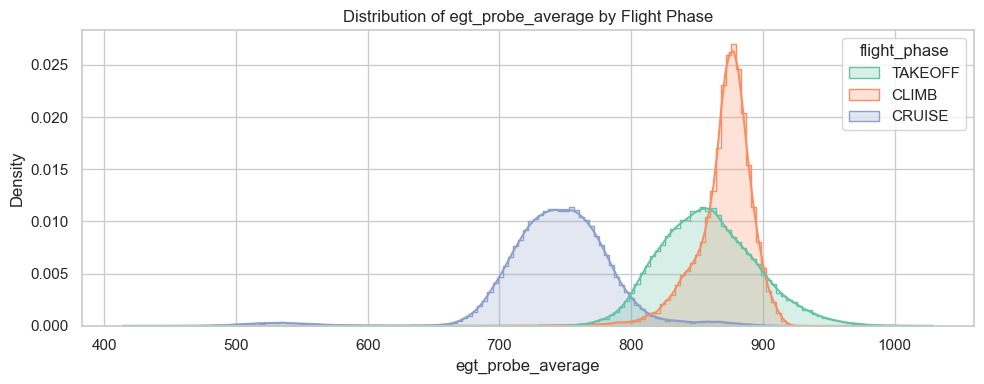

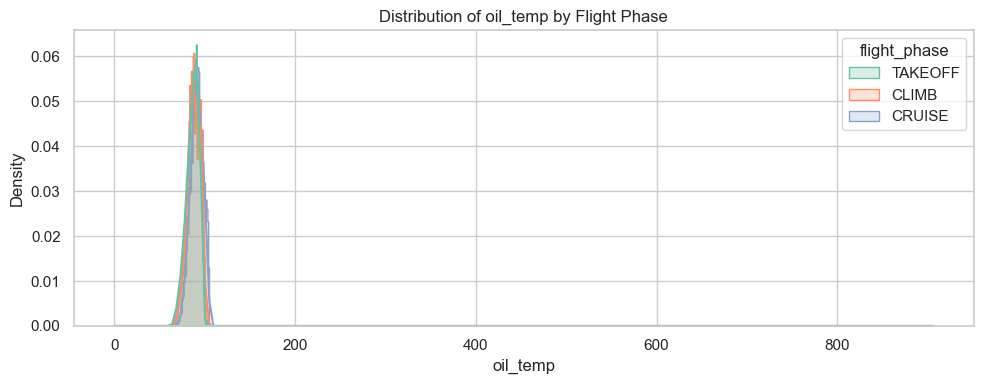

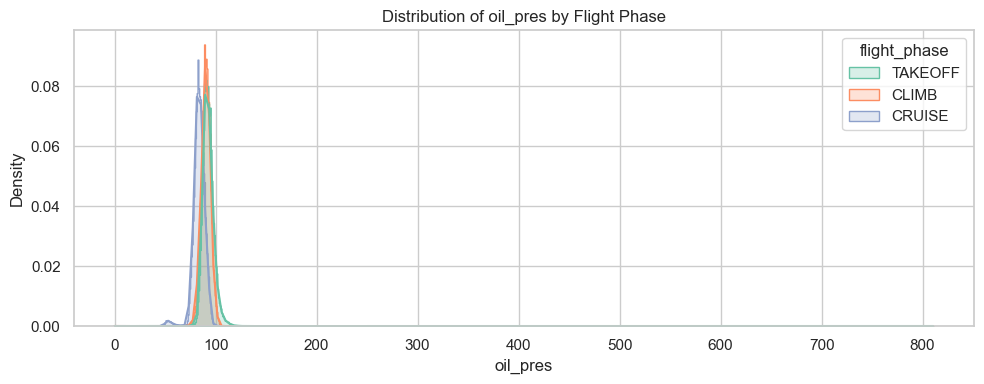

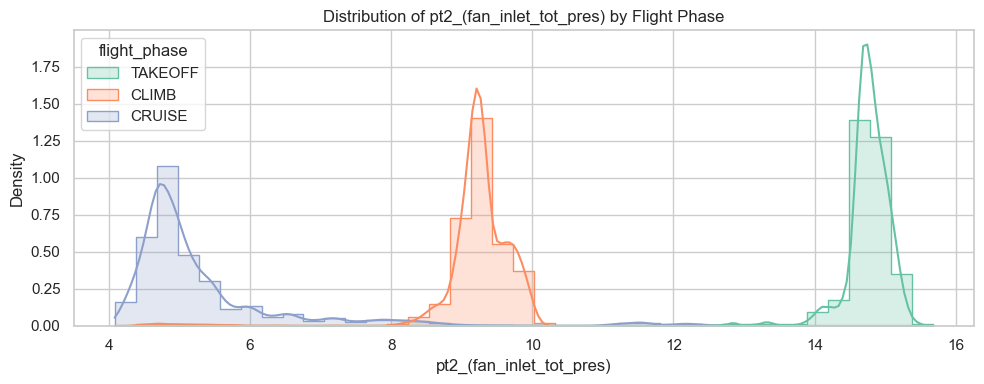

In [59]:
# Plot distributions before outlier removal
plot_feature_distribution_by_phase(df_combined, numerical_features)

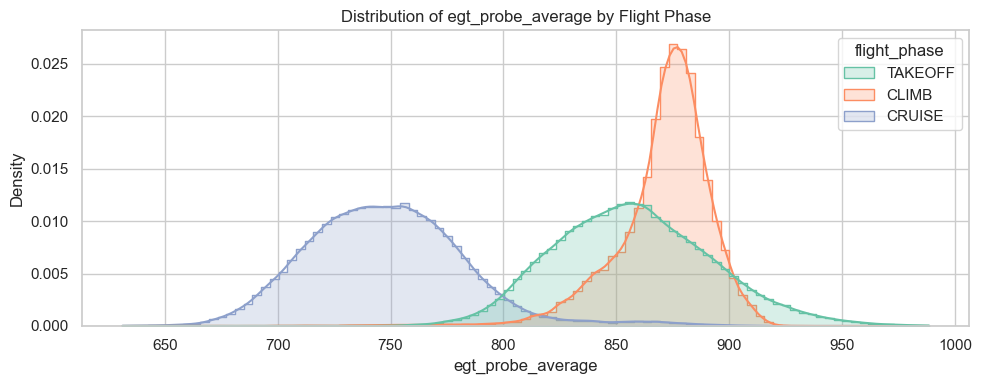

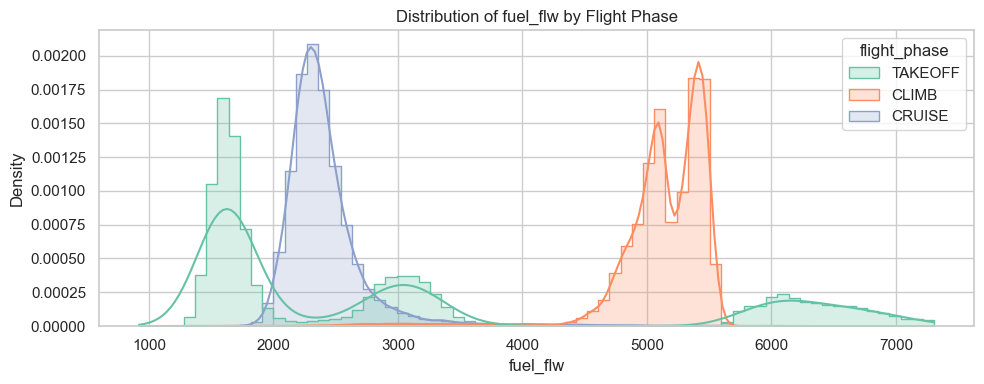

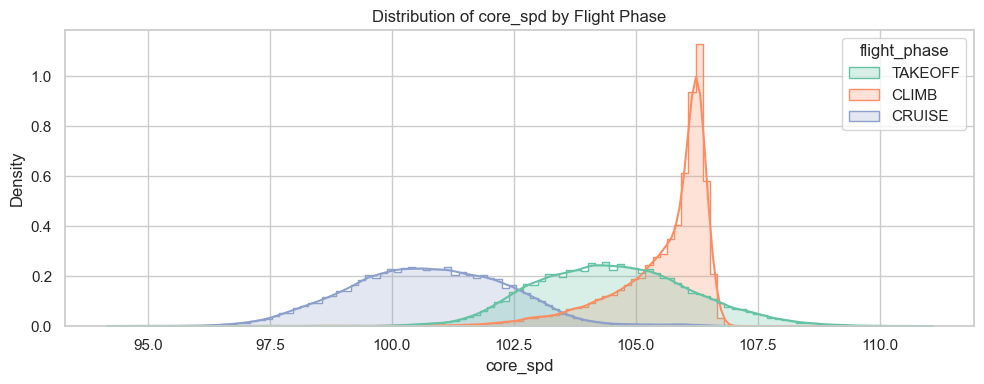

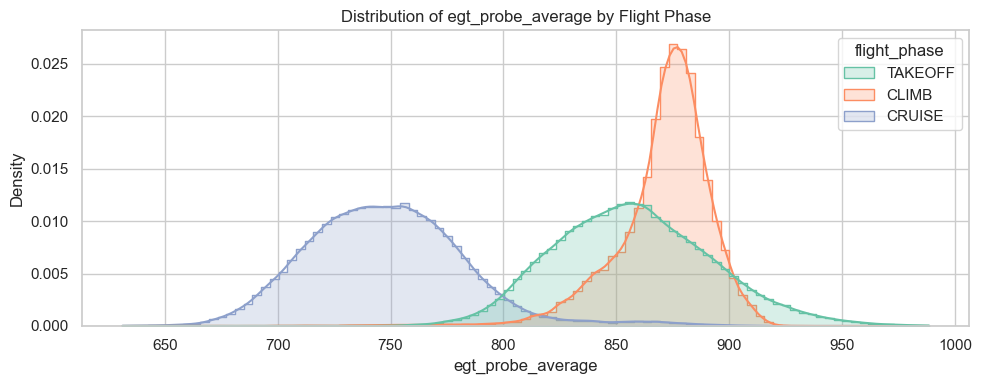

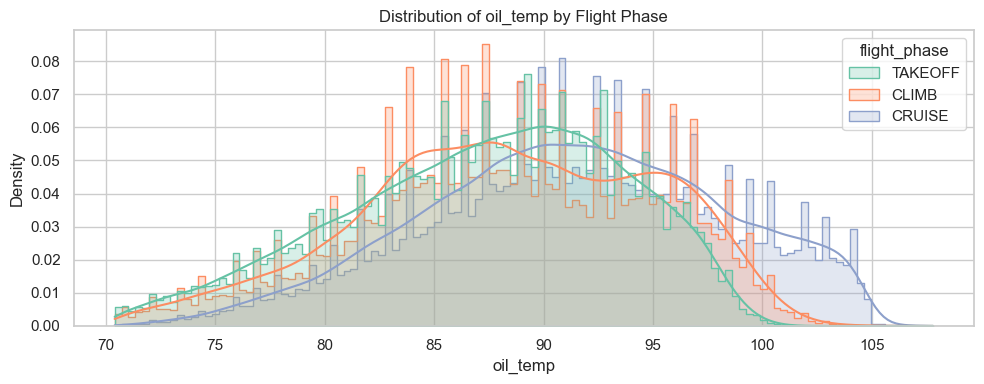

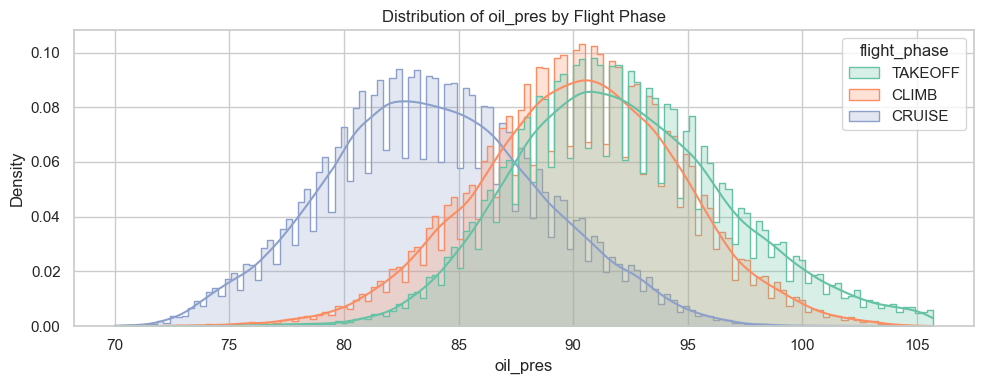

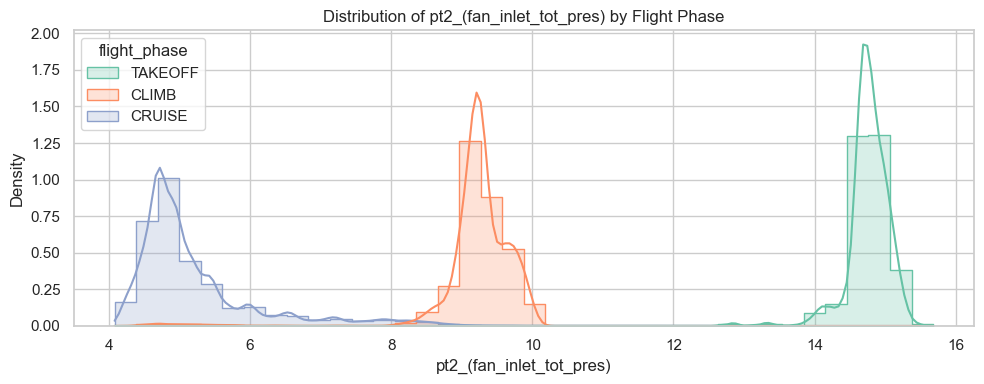

In [60]:
# Plot distributions after outlier removal
plot_feature_distribution_by_phase(df_combined_no_outliers, numerical_features)

📈 Time Series Visualization (for selected engine)

## 13. Time Series Visualization
Visualize time series trends for selected engines and features.

<Figure size 1200x600 with 0 Axes>

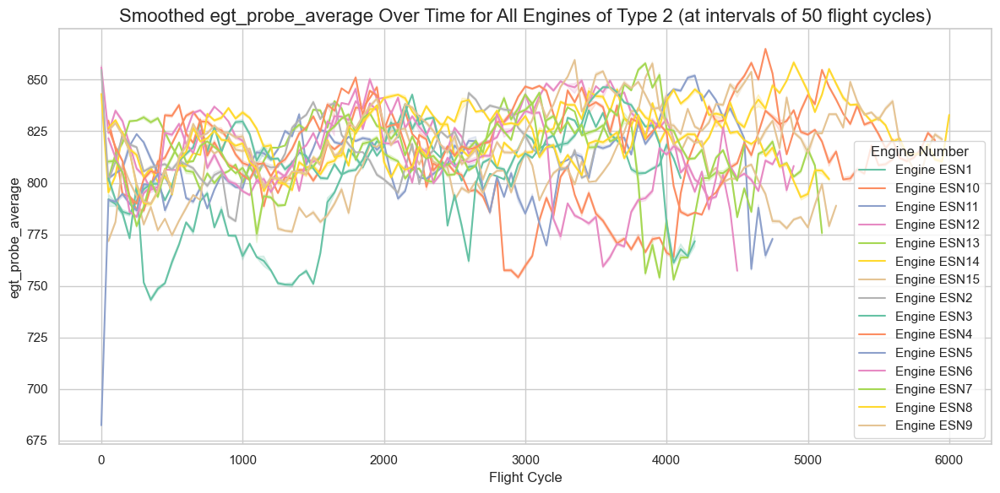

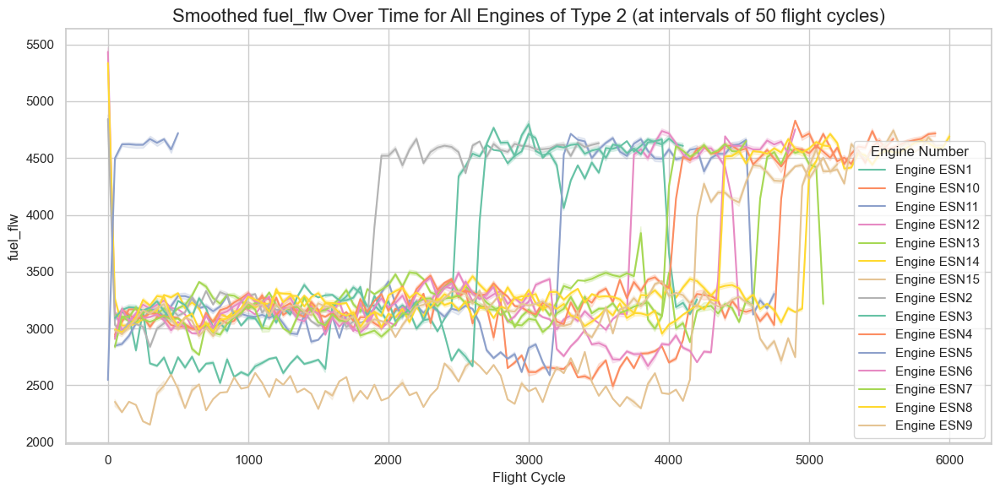

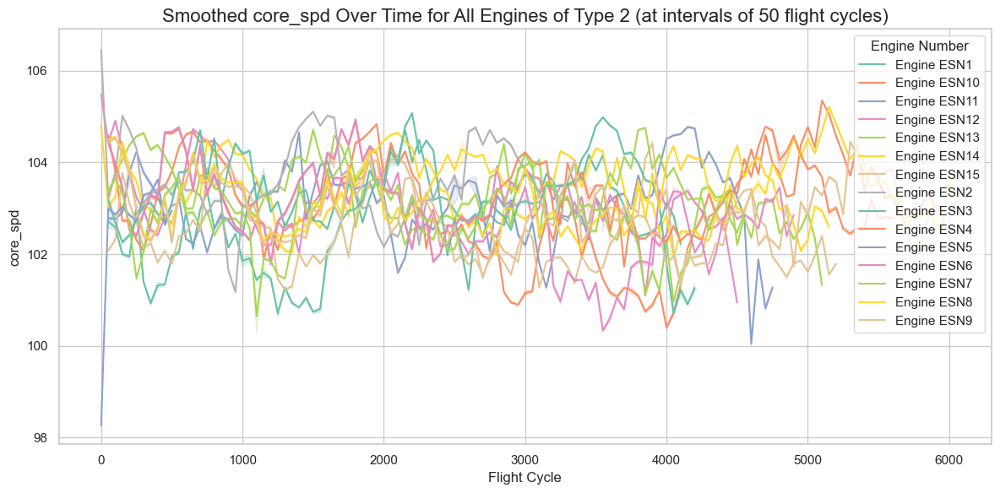

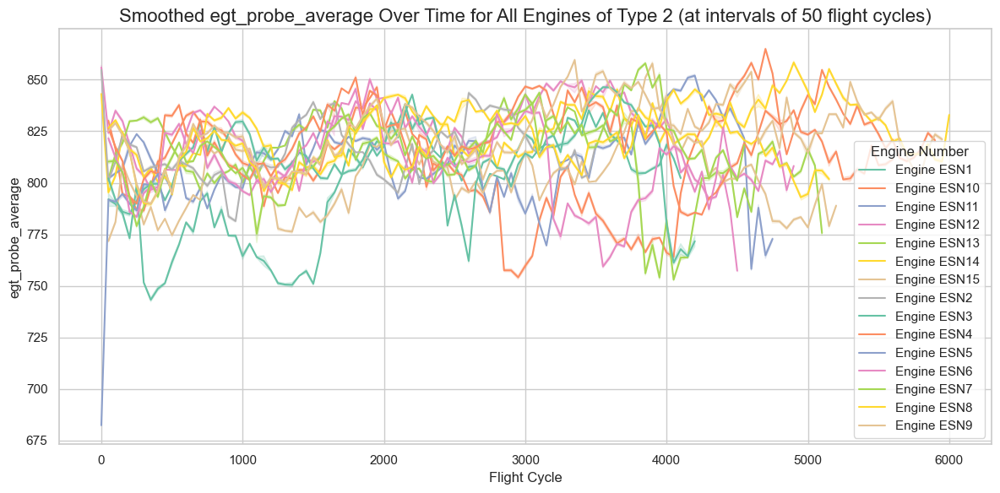

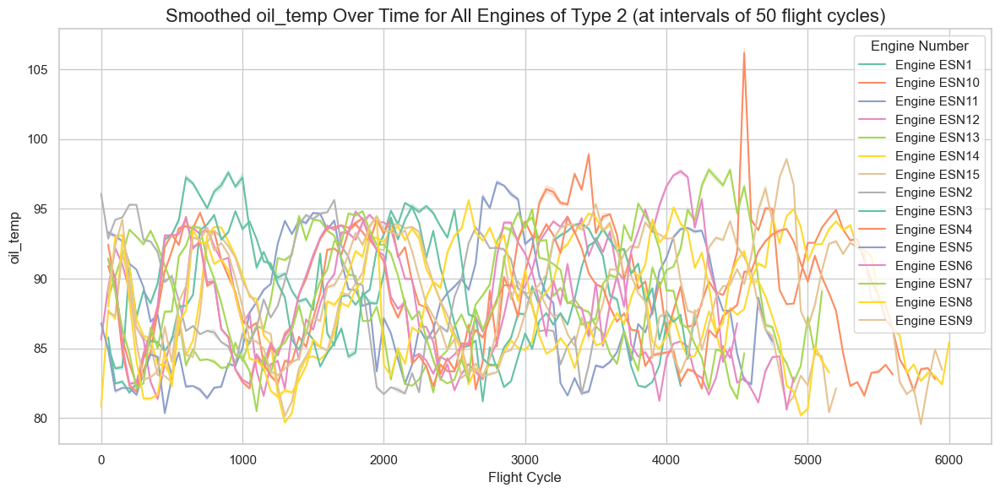

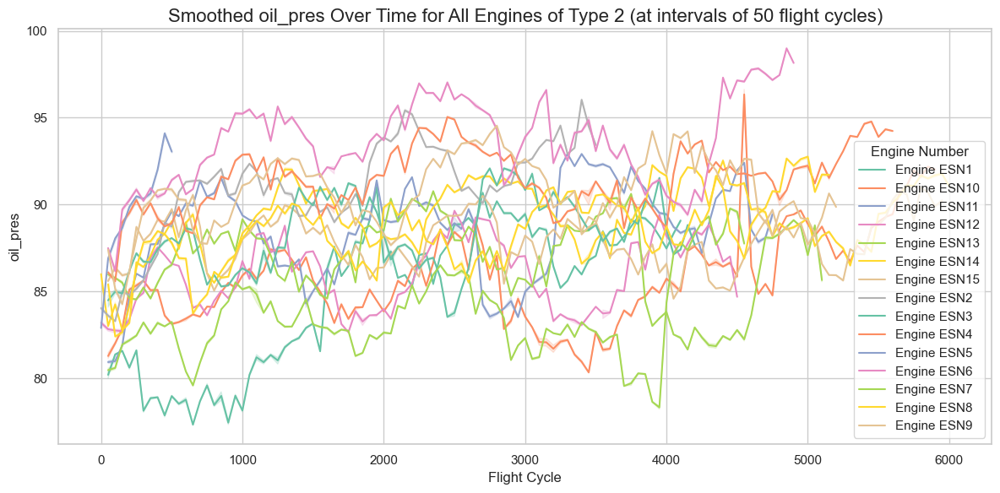

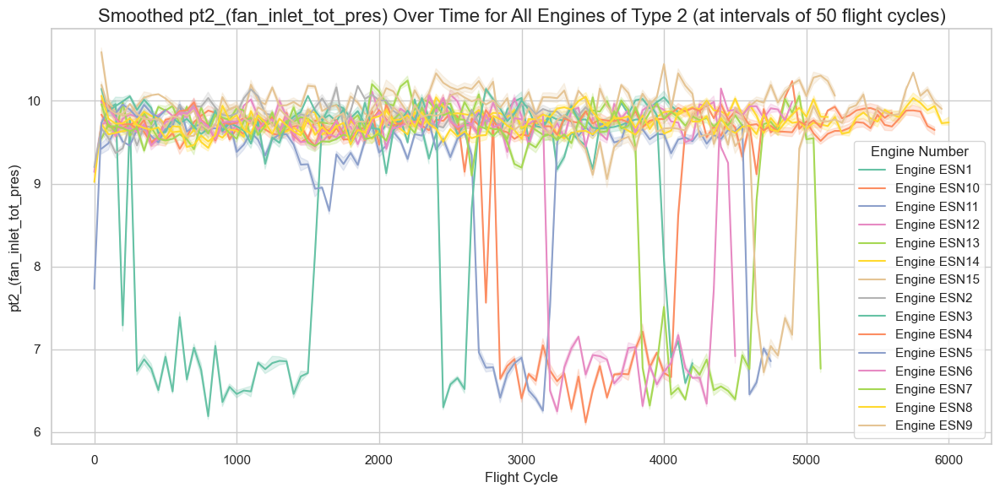

In [61]:
# Create a new figure
plt.figure(figsize=(12, 6))
all_engines = df_combined_no_outliers['esn'].unique()
# Iterate over each numerical feature
for feature in numerical_features:
    plt.figure(figsize=(12, 6))
    
    # Iterate over each engine and plot its smoothed data at intervals of 50 flight cycles
    for engine in all_engines:
        # Filter the DataFrame for the current engine
        engine_sample = df_combined[df_combined['esn'] == engine].copy()
        
        # Smooth the data using exponential moving average
        engine_sample[feature] = engine_sample[feature].ewm(span=100, adjust=False).mean()
        
        # Filter data to include only rows where flight_cycle is a multiple of 50
        engine_sample = engine_sample[engine_sample['flight_cycle'] % 50 == 0]
        
        # Plot the smoothed data
        sns.lineplot(
            data=engine_sample,
            x='flight_cycle',
            y=feature,
            label=f'Engine {engine}'
        )
    
    # Update layout for better visualization
    plt.title(f'Smoothed {feature} Over Time for All Engines (49 engines, at intervals of 50 flight cycles)', fontsize=16)
    plt.xlabel('Flight Cycle', fontsize=12)
    plt.ylabel(feature, fontsize=12)
    plt.legend(title='Engine Number')
    plt.grid(True)
    plt.tight_layout()
    
    # Show the plot
    plt.show()


In [62]:
def plot_smoothed_time_series(df, features, engine_col='esn', cycle_col='flight_cycle', span=100, interval=50):
    engines = df[engine_col].unique()
    for feature in features:
        plt.figure(figsize=(12, 6))
        for engine in engines:
            engine_sample = df[df[engine_col] == engine].copy()
            engine_sample[feature] = engine_sample[feature].ewm(span=span, adjust=False).mean()
            engine_sample = engine_sample[engine_sample[cycle_col] % interval == 0]
            sns.lineplot(data=engine_sample, x=cycle_col, y=feature, label=f'Engine {engine}')
        plt.title(f'Smoothed {feature} Over Time for All Engines (interval: {interval} cycles)', fontsize=16)
        plt.xlabel('Flight Cycle', fontsize=12)
        plt.ylabel(feature, fontsize=12)
        plt.legend(title='Engine Number')
        plt.grid(True)
        plt.tight_layout()
        plt.show()

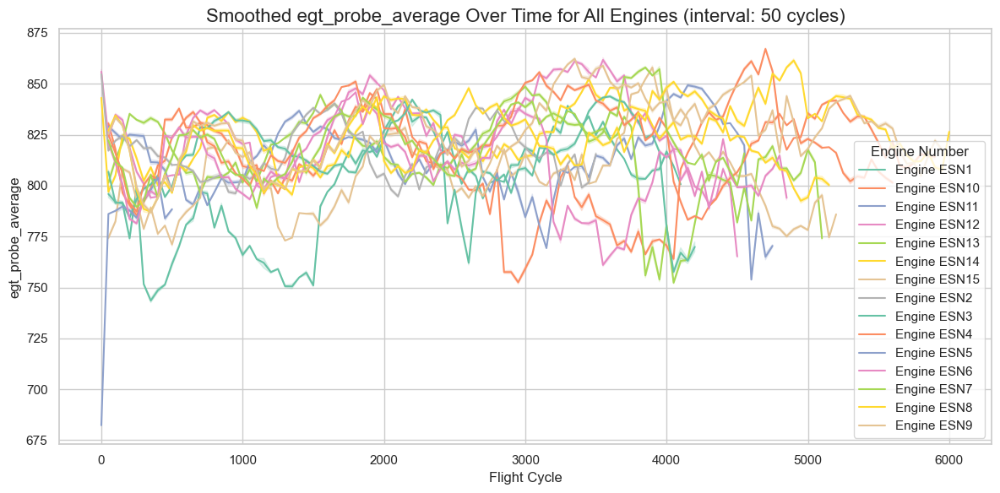

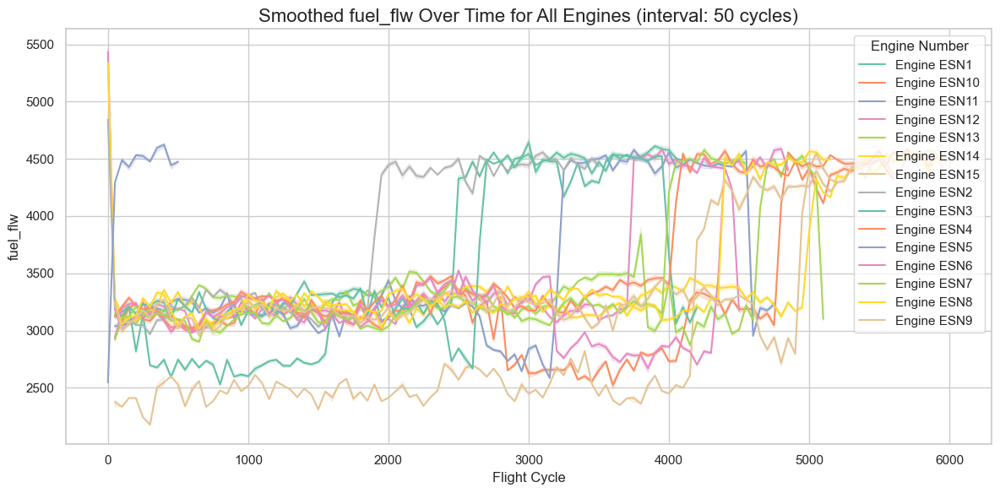

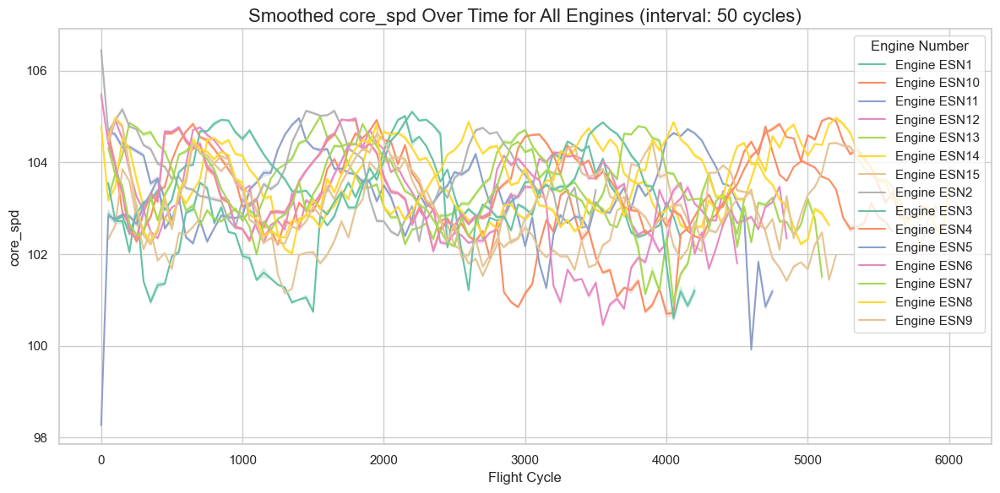

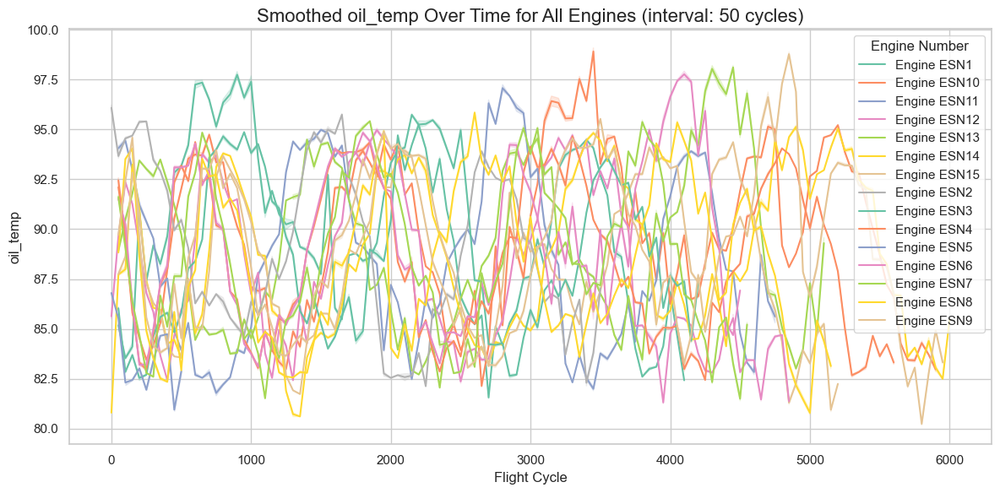

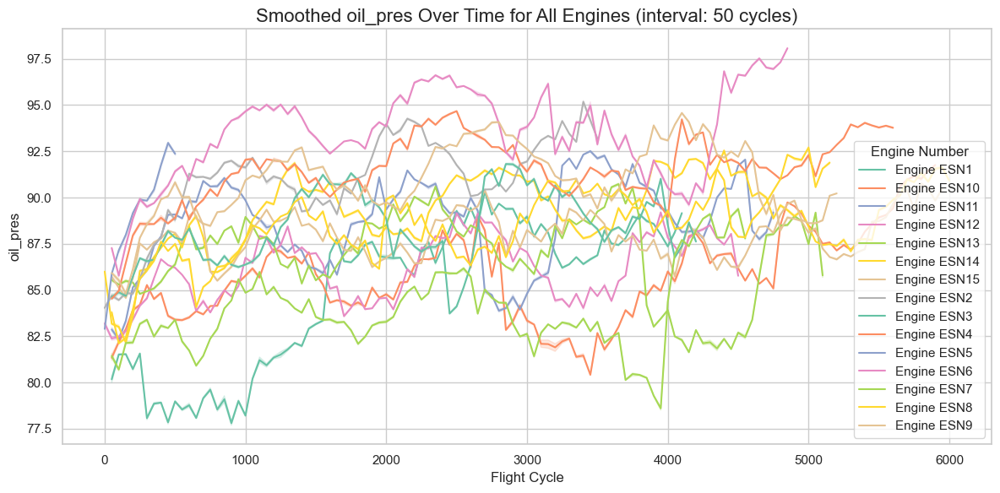

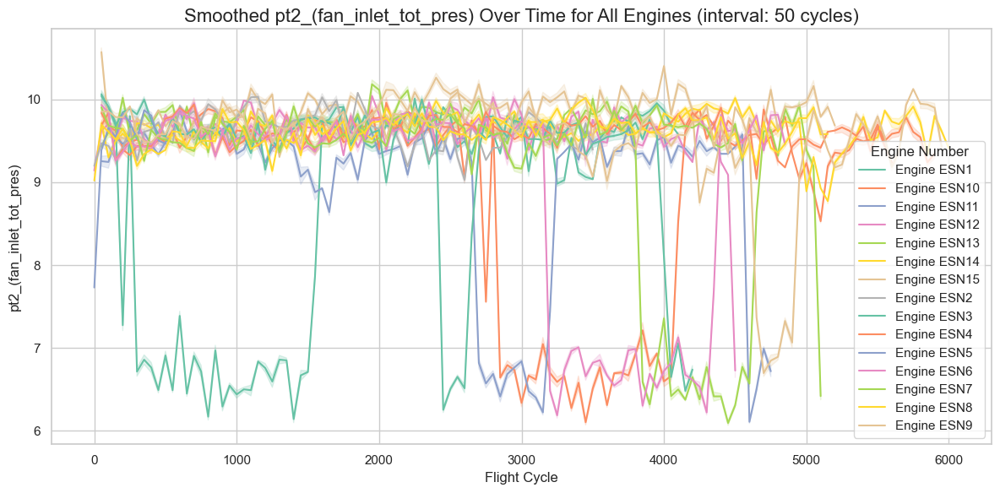

In [106]:
# Plot smoothed time series for all engines and features
plot_smoothed_time_series(df_combined_no_outliers, numerical_features)

📉 5. Trend & Seasonality Detection

## 14. Trend & Seasonality Detection
Analyze periodicity and trends in the data using autocorrelation and STL decomposition.

In [107]:
print(numerical_features)

['egt_probe_average', 'fuel_flw', 'core_spd', 'oil_temp', 'oil_pres', 'pt2_(fan_inlet_tot_pres)']


In [108]:
from statsmodels.tsa.stattools import acf
from scipy.signal import find_peaks
import matplotlib.pyplot as plt

def detect_best_period(series, max_lag=50, plot=False, Feature_name=None):
    # Drop missing values
    series = series.dropna()

    # Calculate autocorrelations
    autocorr = acf(series, nlags=max_lag, fft=True)

    # Find peaks in autocorrelation
    peaks, _ = find_peaks(autocorr[1:])  # exclude lag=0
    if len(peaks) == 0:
        return None  # No clear seasonality
    best_lag = peaks[0] + 1  # +1 because we excluded lag 0
    #best_lag = np.argmax(autocorr[1:]) +1 #because we excluded lag 0
    if plot:
        plt.figure(figsize=(8, 3))
        plt.plot(range(len(autocorr)), autocorr, marker='o')
        plt.axvline(best_lag, color='red', linestyle='--', label=f'Seasonal Period = {best_lag}')
        plt.title(f"Autocorrelation with Detected Period for {Feature_name}")
        plt.xlabel("Lag")
        plt.ylabel("ACF")
        plt.legend()
        plt.tight_layout()
        plt.show()

    return best_lag


In [109]:
#
df_avg = df_combined.copy()
# Set flight_datetime_c as the index
df_avg.set_index('flight_datetime_c', inplace=True)
# Resample the DataFrame to month frequency and calculate the mean for each day
df_month_avg_cruise = df_avg[df_avg['flight_phase'] == 'CRUISE'][numerical_features].resample('M').mean()
df_month_avg_climb = df_avg[df_avg['flight_phase'] == 'CLIMB'][numerical_features].resample('M').mean()
df_month_avg_take = df_avg[df_avg['flight_phase'] == 'TAKEOFF'][numerical_features].resample('M').mean()


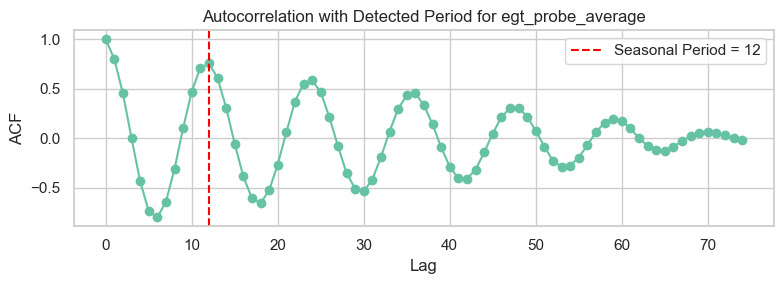

Best period for egt_probe_average in TAKEOFF phase: 12 months


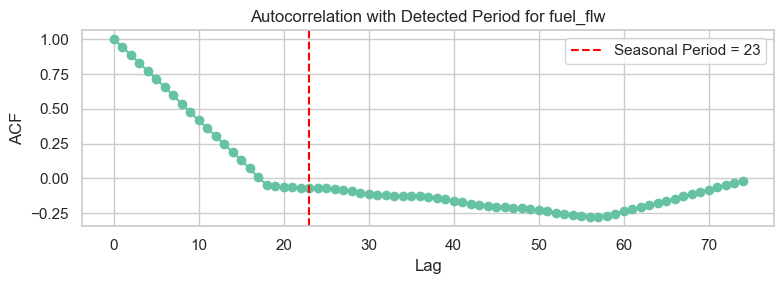

Best period for fuel_flw in TAKEOFF phase: 23 months


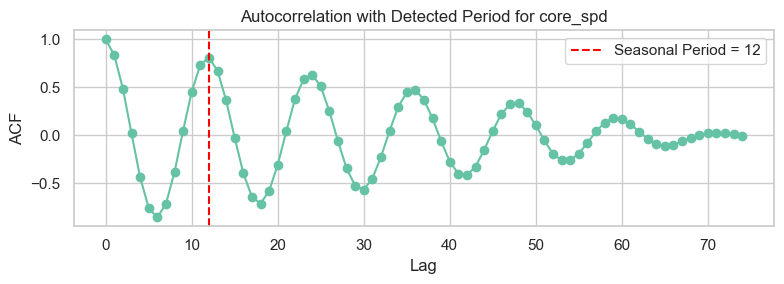

Best period for core_spd in TAKEOFF phase: 12 months


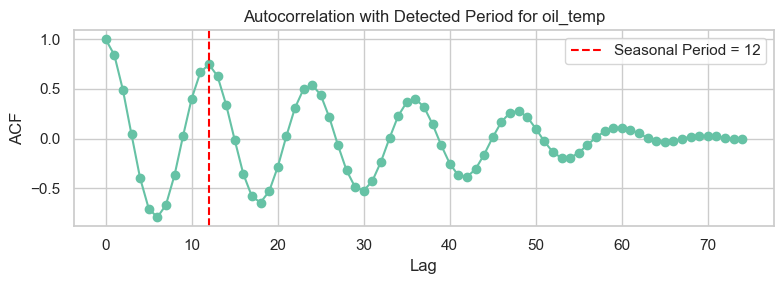

Best period for oil_temp in TAKEOFF phase: 12 months


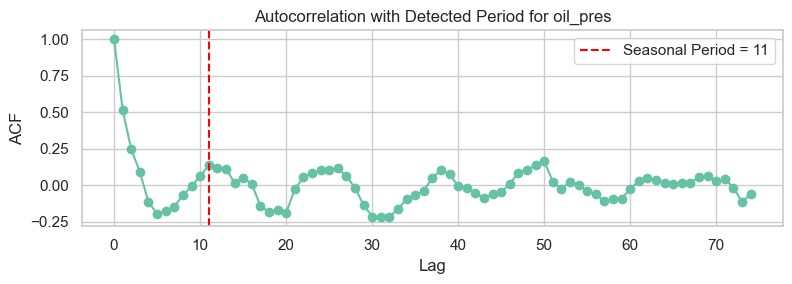

Best period for oil_pres in TAKEOFF phase: 11 months


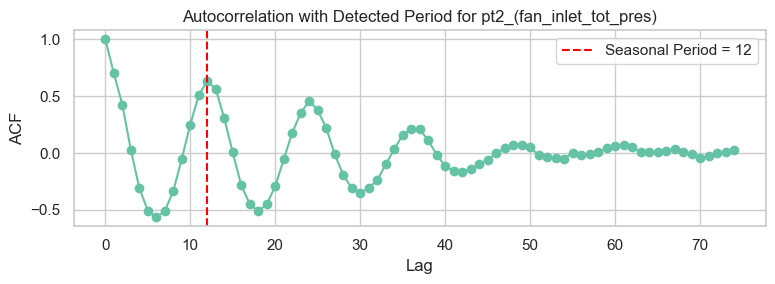

Best period for pt2_(fan_inlet_tot_pres) in TAKEOFF phase: 12 months


In [110]:
# use detect_best_period function to detect the best period for each feature in the take off phase
for feature in numerical_features:
    best_period = detect_best_period(df_month_avg_take[feature], max_lag=800, plot=True, Feature_name=feature)
    print(f"Best period for {feature} in TAKEOFF phase: {best_period} months")
    

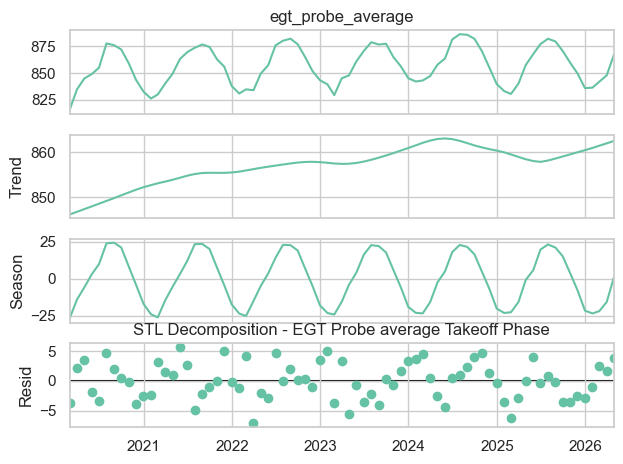

In [111]:
from statsmodels.tsa.seasonal import STL

series = df_month_avg_take['egt_probe_average']
stl = STL(series, seasonal= 13)
res = stl.fit()
res.plot()
plt.title("STL Decomposition - EGT Probe average Takeoff Phase")
plt.show()


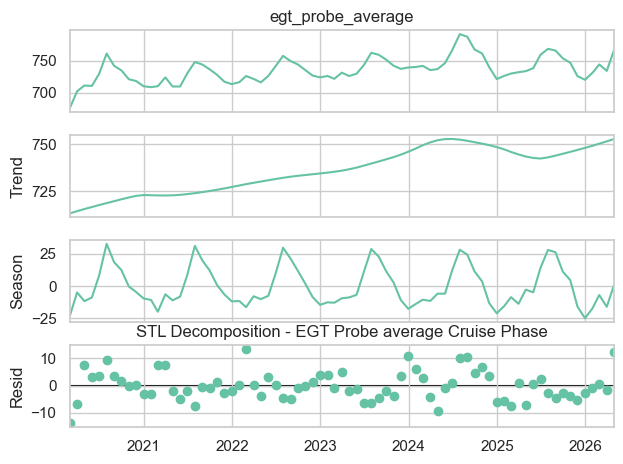

In [112]:
from statsmodels.tsa.seasonal import STL

series = df_month_avg_cruise['egt_probe_average']
stl = STL(series, seasonal= 13)
res = stl.fit()
res.plot()
plt.title("STL Decomposition - EGT Probe average Cruise Phase")
plt.show()


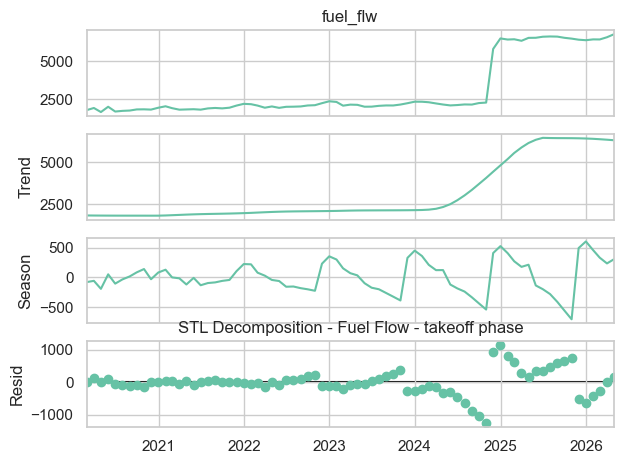

In [113]:
from statsmodels.tsa.seasonal import STL

series = df_month_avg_take['fuel_flw']
stl = STL(series, seasonal= 13)
res = stl.fit()
res.plot()
plt.title("STL Decomposition - Fuel Flow - takeoff phase")
plt.show()

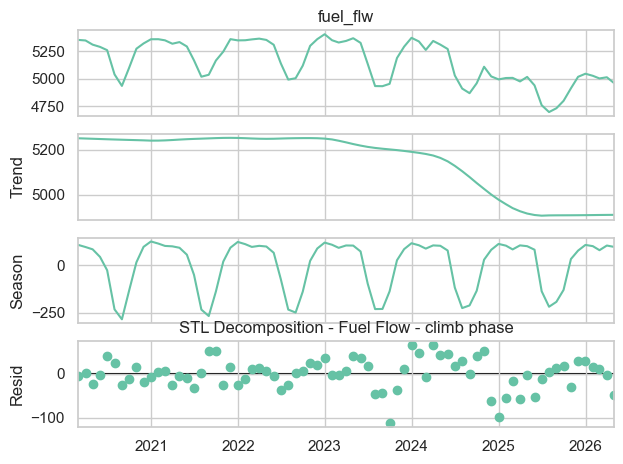

In [114]:
from statsmodels.tsa.seasonal import STL

series = df_month_avg_climb['fuel_flw']
stl = STL(series, seasonal= 13)
res = stl.fit()
res.plot()
plt.title("STL Decomposition - Fuel Flow - climb phase")
plt.show()

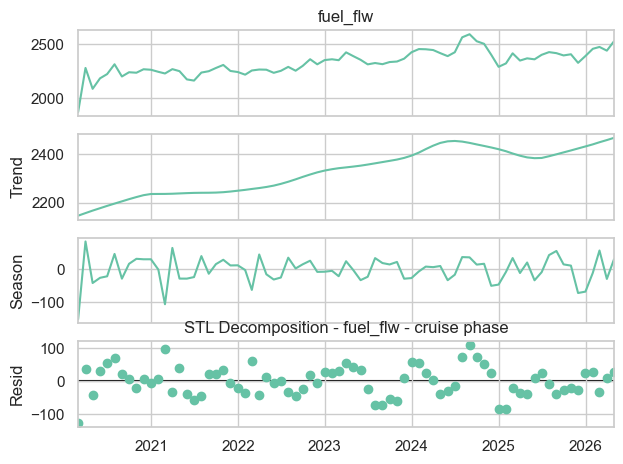

In [115]:
from statsmodels.tsa.seasonal import STL

series = df_month_avg_cruise['fuel_flw']
stl = STL(series, seasonal= 13)
res = stl.fit()
res.plot()
plt.title("STL Decomposition - fuel_flw - cruise phase")
plt.show()

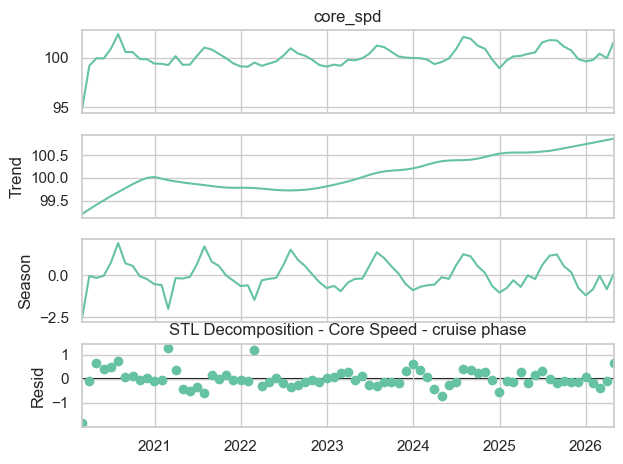

In [116]:
from statsmodels.tsa.seasonal import STL

series = df_month_avg_cruise['core_spd']
stl = STL(series, seasonal= 13)
res = stl.fit()
res.plot()
plt.title("STL Decomposition - Core Speed - cruise phase")
plt.show()

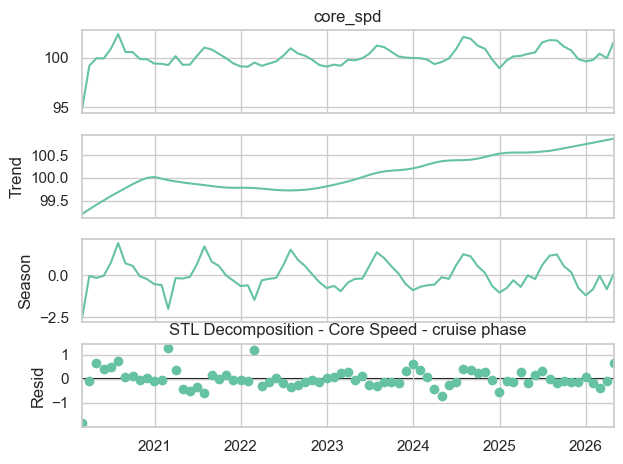

In [117]:
from statsmodels.tsa.seasonal import STL

series = df_month_avg_cruise['core_spd']
stl = STL(series, seasonal= 13)
res = stl.fit()
res.plot()
plt.title("STL Decomposition - Core Speed - cruise phase")
plt.show()

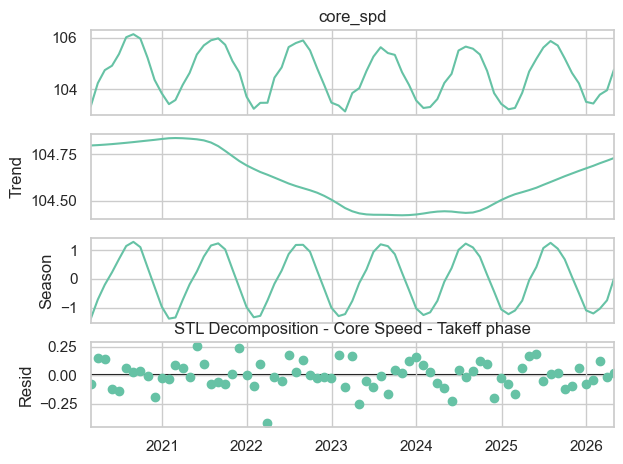

In [118]:
from statsmodels.tsa.seasonal import STL

series = df_month_avg_take['core_spd']
stl = STL(series, seasonal= 13)
res = stl.fit()
res.plot()
plt.title("STL Decomposition - Core Speed - Takeff phase")
plt.show()

## 15. Anomaly Detection
Detect anomalies using Isolation Forest and visualize them.

In [119]:
df_combined.reset_index(drop=True, inplace=True)

In [120]:
df_combined.head()

,aircraft_id,eposition,esn,flight_phase,eng_type,eng_install_date,cycles,fuel_flw,oil_temp,egt_divergence_,...,core_spd,core_spd_divergence,pt2_(fan_inlet_tot_pres),egt_probe_average,eng_number,flight_datetime_c,date,time,flight_cycle,RCL
0,AIRCRAFT1,1.0,ESN1,TAKEOFF,LEAP-1A26E1,16-01-23 23:00,2.0,1762.0,79.3,-8.95,...,105.28,0.060,14.93,865.2875,ESN1,2023-01-17 07:28:00,2023-01-17,07:28:00,1,4107
1,AIRCRAFT1,1.0,ESN1,CLIMB,LEAP-1A26E1,16-01-23 23:00,3.0,5327.0,84.5,-10.55,...,105.48,0.085,9.36,844.4625,ESN1,2023-01-17 07:28:00,2023-01-17,07:28:00,1,4107
2,AIRCRAFT1,1.0,ESN1,CRUISE,LEAP-1A26E1,16-01-23 23:00,3.0,2490.0,91.0,-8.60,...,101.89,0.095,5.17,752.6250,ESN1,2023-01-17 08:37:00,2023-01-17,08:37:00,1,4107
3,AIRCRAFT1,1.0,ESN1,TAKEOFF,LEAP-1A26E1,16-01-23 23:00,3.0,3252.0,88.7,-10.90,...,108.06,0.110,15.30,916.7125,ESN1,2023-01-17 14:13:00,2023-01-17,14:13:00,2,4106
4,AIRCRAFT1,1.0,ESN1,CLIMB,LEAP-1A26E1,16-01-23 23:00,4.0,4954.0,93.5,-9.60,...,106.40,0.100,10.01,849.0375,ESN1,2023-01-17 14:13:00,2023-01-17,14:13:00,2,4106


In [ ]:
from sklearn.ensemble import IsolationForest
numerical_features_nofan = ['egt_probe_average', 'fuel_flw', 'core_spd', 'oil_temp', 'oil_pres', 'pt2_(fan_inlet_tot_pres)']

# Choose an engine that actually has TAKEOFF rows after filtering/outlier removal
takeoff_pool = df_combined_no_outliers[df_combined_no_outliers['flight_phase'] == 'TAKEOFF']
available_engines = takeoff_pool['esn'].unique()
print("Available engines with TAKEOFF data:", list(available_engines)[:10])

sample_esn = available_engines[0] if len(available_engines) else None
if sample_esn is None:
    raise ValueError("No engines have TAKEOFF data after outlier removal - cannot run anomaly detection.")

sample_engine = takeoff_pool[takeoff_pool['esn'] == sample_esn].copy()
print(f"Using {sample_esn} with {len(sample_engine)} TAKEOFF rows for anomaly detection.")

# Fit Isolation Forest to detect anomalies in the selected features
iso = IsolationForest(contamination=0.01, random_state=42)
sample_engine['anomaly'] = iso.fit_predict(sample_engine[numerical_features_nofan])
anomalies = sample_engine[sample_engine['anomaly'] == -1]
print(f"Detected {len(anomalies)} anomalies out of {len(sample_engine)} rows.")


In [ ]:
# plot anomalies for numerical_features_nofan

for feature in numerical_features_nofan:
    plt.figure(figsize=(10, 4))
    sns.scatterplot(
        data=sample_engine, x="flight_datetime_c", y=feature, hue="anomaly",
        palette={1: "blue", -1: "red"},
        s=sample_engine['anomaly'].apply(lambda x: 200 if x == -1 else 20),
        edgecolor="black", alpha=0.9, legend=False,
        marker="X" if sample_engine['anomaly'].eq(-1).any() else "o"
    )
    plt.title(f"Anomalies in {feature} for {sample_esn} (Takeoff Phase)")
    plt.xlabel("Time")
    plt.ylabel(feature)
    plt.tight_layout()
    plt.show()


In [125]:
# Perform anomaly detection on df_combined_no_outliers
iso = IsolationForest(contamination=0.01, random_state=42)
df_combined_no_outliers['anomaly'] = iso.fit_predict(df_combined_no_outliers[numerical_features_nofan])
# Anomalies are labeled as -1, normal points as 1

In [126]:
# Calculate the number of anomalies for each flight phase
anomalies_by_phase = df_combined_no_outliers[df_combined_no_outliers['anomaly'] == -1].groupby('flight_phase').size()
# Convert to a DataFrame for better visualization
anomalies_table = anomalies_by_phase.reset_index(name='Number of Anomalies')
# Display the table
print(anomalies_table)

  flight_phase  Number of Anomalies
0        CLIMB                  126
1       CRUISE                  835
2      TAKEOFF                 1452


## 16. Dimensionality Reduction with PCA
Apply PCA to reduce dimensionality and analyze explained variance.

In [127]:
# use PCA to reduce the dimensionality of the data

scaled_data = StandardScaler().fit_transform(df_combined_no_outliers[numerical_features_nofan])
pca = PCA(n_components=4)
pca_result = pca.fit_transform(scaled_data)
# show the explained variance ratio
explained_variance = pca.explained_variance_ratio_
print(f"Explained variance ratio: {np.sum(explained_variance)}")


Explained variance ratio: 0.9657085636809627


## 17. Correlation Analysis
Analyze the correlation between numerical features.

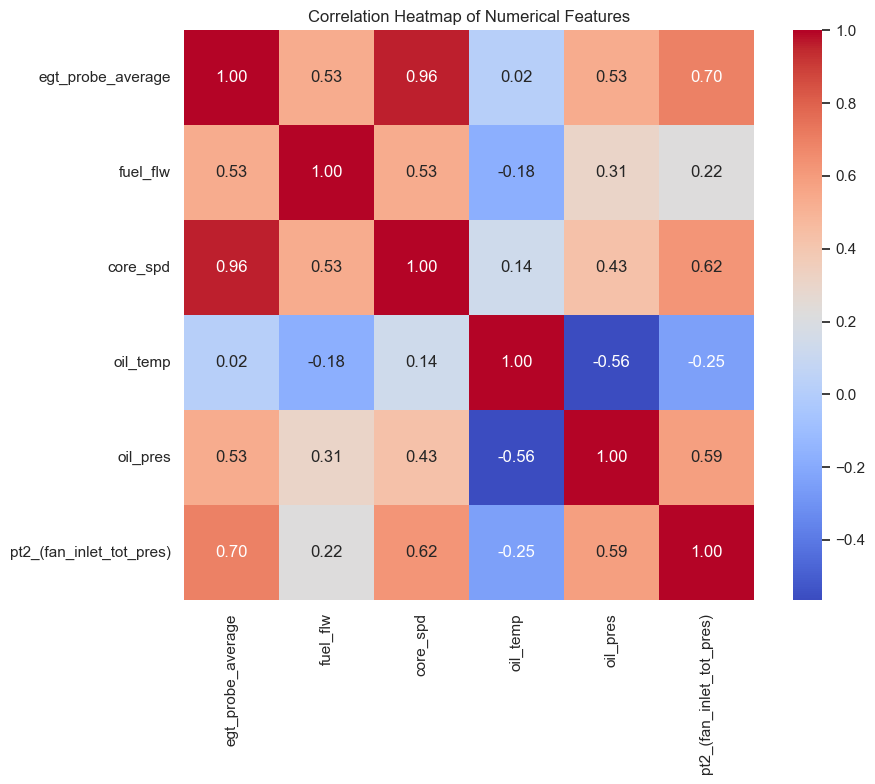

In [128]:
# --- Correlation Analysis ---
import matplotlib.pyplot as plt
import seaborn as sns

# Compute correlation matrix for numerical features (after outlier removal)
corr_matrix = df_combined_no_outliers[numerical_features].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True)
plt.title('Correlation Heatmap of Numerical Features')
plt.tight_layout()
plt.show()

## 18. Feature Importance (Random Forest)
Analyze the importance of features using a Random Forest Regressor.

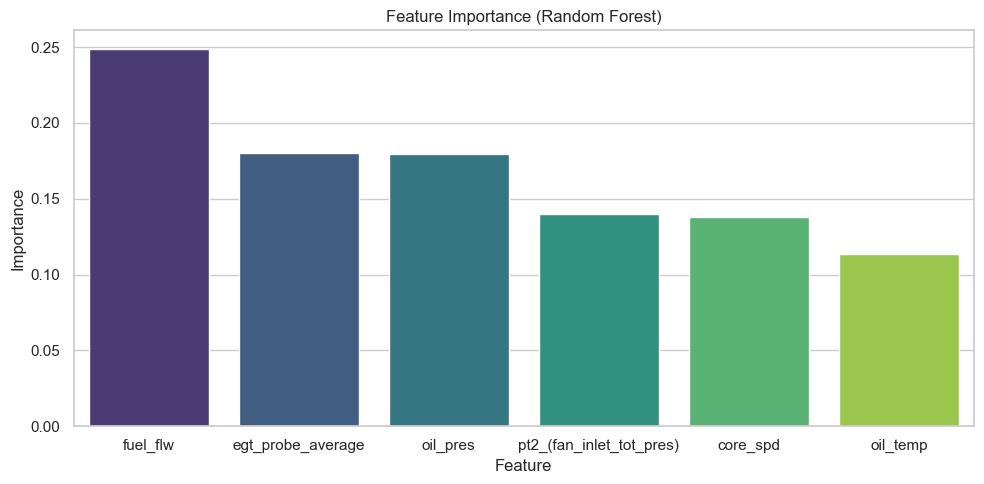

In [129]:
# --- Feature Importance (Random Forest) ---
from sklearn.ensemble import RandomForestRegressor
numerical_features = ['egt_probe_average', 'fuel_flw', 'core_spd','oil_temp','oil_pres','pt2_(fan_inlet_tot_pres)']
# Prepare data for feature importance (drop NA rows for simplicity)
X = df_combined_no_outliers[numerical_features].dropna()
y = df_combined_no_outliers.loc[X.index, 'RCL']  # or use 'RCL' if available

rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X, y)
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(10, 5))
sns.barplot(x=np.array(numerical_features)[indices], y=importances[indices], palette='viridis')
plt.title('Feature Importance (Random Forest)')
plt.ylabel('Importance')
plt.xlabel('Feature')
plt.tight_layout()
plt.show()

## 19. PCA Scatter Plot
Visualize the first two principal components of the PCA, colored by flight phase or anomaly status.

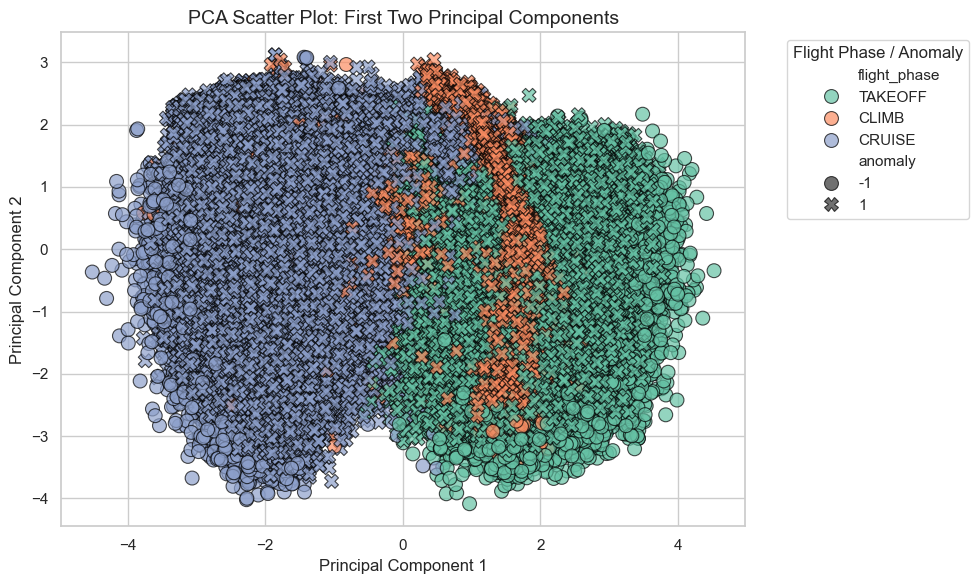

In [130]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Recompute PCA results
numerical_features_nofan = ['egt_probe_average', 'fuel_flw', 'core_spd', 'oil_temp', 'oil_pres', 'pt2_(fan_inlet_tot_pres)']
scaled_data = StandardScaler().fit_transform(df_combined_no_outliers[numerical_features_nofan].dropna())
pca = PCA(n_components=4)
pca_result = pca.fit_transform(scaled_data)

# Create a DataFrame for PCA results
pca_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2', 'PC3', 'PC4'])
pca_df['flight_phase'] = df_combined_no_outliers.dropna(subset=numerical_features_nofan)['flight_phase'].values
pca_df['anomaly'] = df_combined_no_outliers.dropna(subset=numerical_features_nofan)['anomaly'].values

# Plot the first two principal components
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=pca_df, x='PC1', y='PC2', hue='flight_phase', style='anomaly',
    palette='Set2', s=100, edgecolor='black', alpha=0.7
)
plt.title('PCA Scatter Plot: First Two Principal Components', fontsize=14)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Flight Phase / Anomaly', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

## 20. Key Findings from EDA
1. **Flight Phase Distribution**: The dataset contains multiple flight phases, with 'CRUISE' and 'CLIMB' being the most frequent.
2. **Missing Values**: Missing values were handled using linear interpolation, especially for features like `core_sped`.
3. **Outlier Removal**: Approximately 2.78% of the data was removed as outliers using Z-score thresholds.
4. **Anomaly Detection**: Anomalies were detected using Isolation Forest, with anomalies increasing towards the end of engine life.
5. **PCA Analysis**: The first two principal components explain a significant portion of the variance, providing a clear separation of flight phases and anomalies.

## Time Series Analysis for Multiple Features
Investigate seasonality and trends for features using STL decomposition and autocorrelation.

In [131]:
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import acf
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

def analyze_seasonality_and_trends(df, features, phase='CRUISE', freq='M', max_lag=50):
    for feature in features:
        print(f'Analyzing {feature} for {phase} phase...')
        # Filter data for the specified flight phase
        phase_data = df[df['flight_phase'] == phase].copy()
        phase_data.set_index('flight_datetime_c', inplace=True)
        resampled_data = phase_data[feature].resample(freq).mean()
        
        # STL Decomposition
        stl = STL(resampled_data, seasonal=13)
        res = stl.fit()
        res.plot()
        plt.title(f'STL Decomposition - {feature} ({phase} phase)')
        plt.show()
        
        # Autocorrelation Analysis
        autocorr = acf(resampled_data.dropna(), nlags=max_lag, fft=True)
        peaks, _ = find_peaks(autocorr[1:])
        best_lag = peaks[0] + 1 if len(peaks) > 0 else None
        plt.figure(figsize=(8, 3))
        plt.plot(range(len(autocorr)), autocorr, marker='o')
        if best_lag:
            plt.axvline(best_lag, color='red', linestyle='--', label=f'Seasonal Period = {best_lag}')
        plt.title(f'Autocorrelation for {feature} ({phase} phase)')
        plt.xlabel('Lag')
        plt.ylabel('ACF')
        plt.legend()
        plt.tight_layout()
        plt.show()
        
        if best_lag:
            print(f'Best seasonal period for {feature}: {best_lag} months')
        else:
            print(f'No clear seasonality detected for {feature}')

Analyzing egt_probe_average for CLIMB phase...


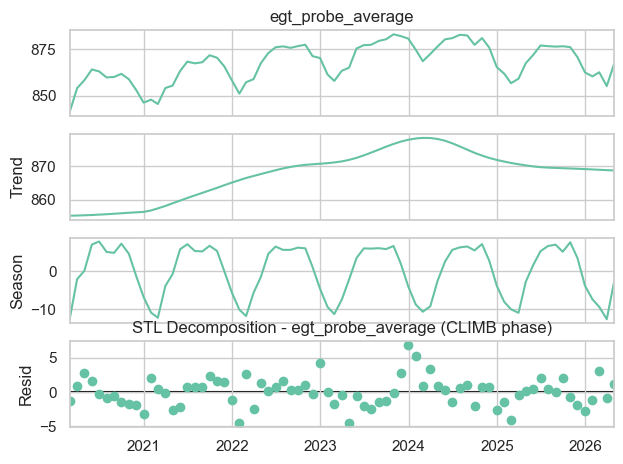

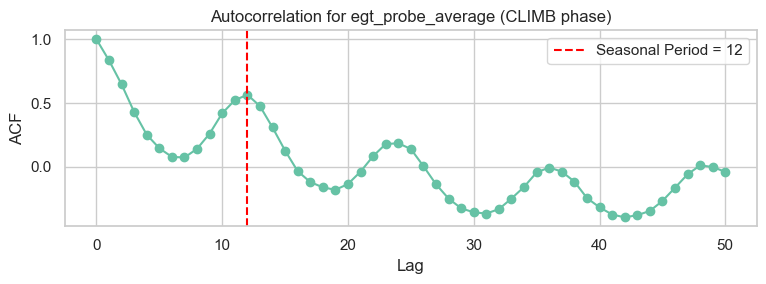

Best seasonal period for egt_probe_average: 12 months
Analyzing fuel_flw for CLIMB phase...


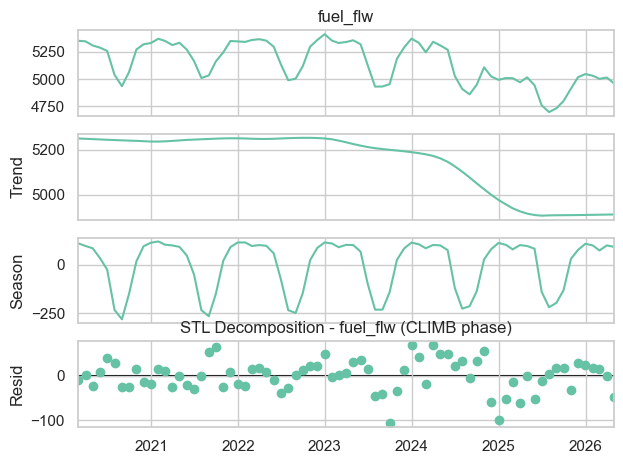

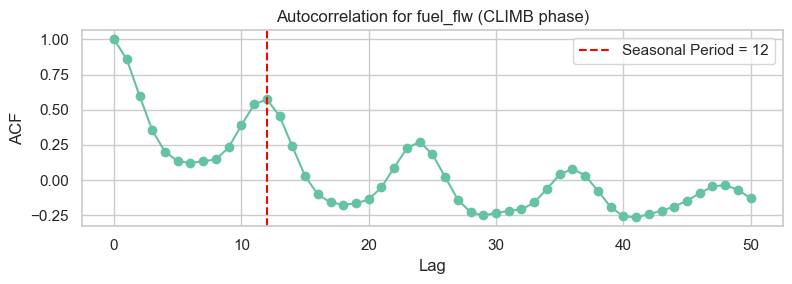

Best seasonal period for fuel_flw: 12 months
Analyzing core_spd for CLIMB phase...


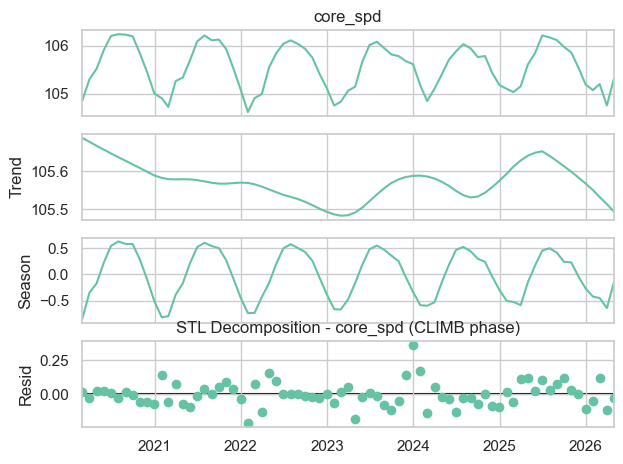

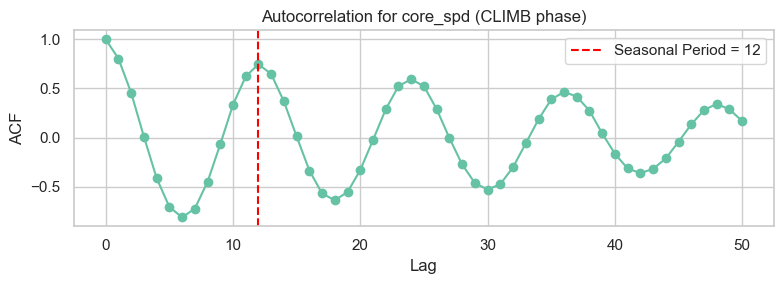

Best seasonal period for core_spd: 12 months
Analyzing oil_temp for CLIMB phase...


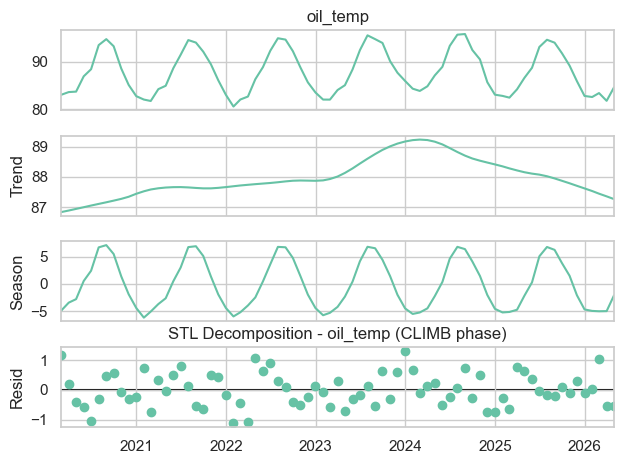

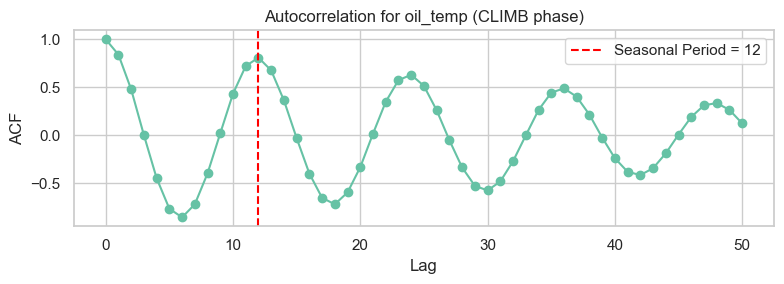

Best seasonal period for oil_temp: 12 months
Analyzing oil_pres for CLIMB phase...


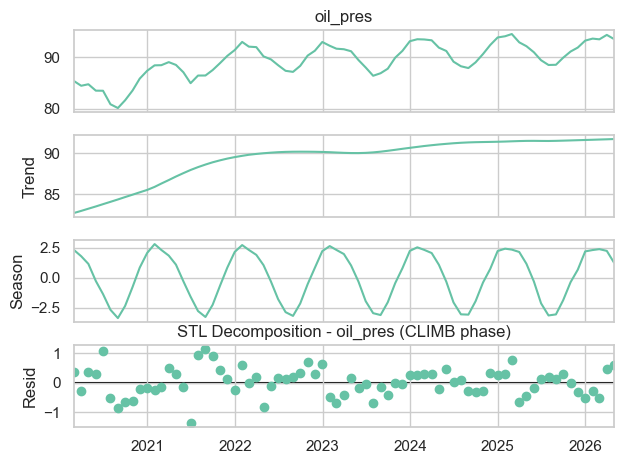

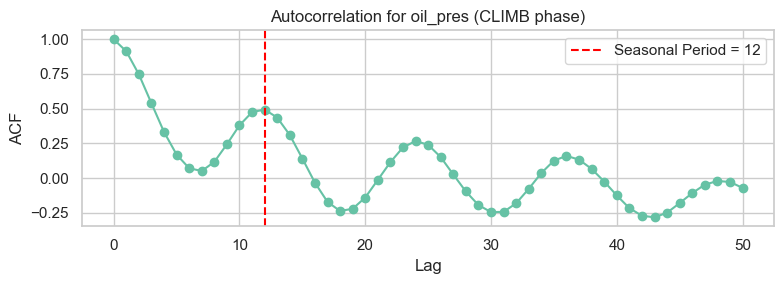

Best seasonal period for oil_pres: 12 months
Analyzing pt2_(fan_inlet_tot_pres) for CLIMB phase...


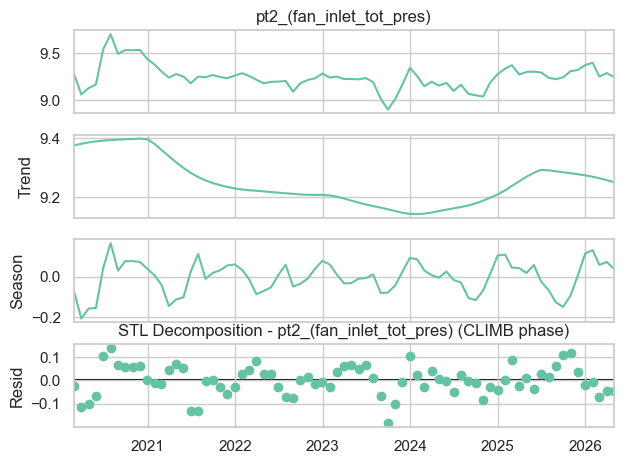

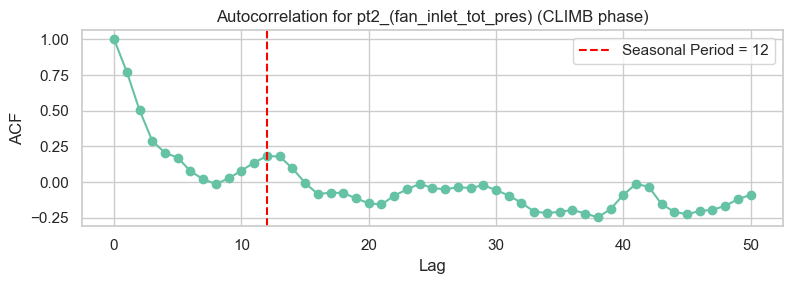

Best seasonal period for pt2_(fan_inlet_tot_pres): 12 months


In [133]:
# Analyze seasonality and trends for selected features
selected_features = ['egt_probe_average', 'fuel_flw', 'core_spd', 'oil_temp', 'oil_pres', 'pt2_(fan_inlet_tot_pres)']
analyze_seasonality_and_trends(df_combined_no_outliers, selected_features, phase='CLIMB')

In [134]:
# Calculate the number of anomalies for each flight phase",
anomalies_by_phase = df_combined_no_outliers[df_combined_no_outliers['anomaly'] == -1].groupby('flight_phase').size()
# Convert to a DataFrame for better visualization
anomalies_table = anomalies_by_phase.reset_index(name='Number of Anomalies')
# Display the table
print(anomalies_table)

  flight_phase  Number of Anomalies
0        CLIMB                  126
1       CRUISE                  835
2      TAKEOFF                 1452


## 21. Engine Life Analysis
Investigate the relationship between engine remaining cycle life (RCL) and specific features during the 'CRUISE' flight phase to identify early warning signs of failure.

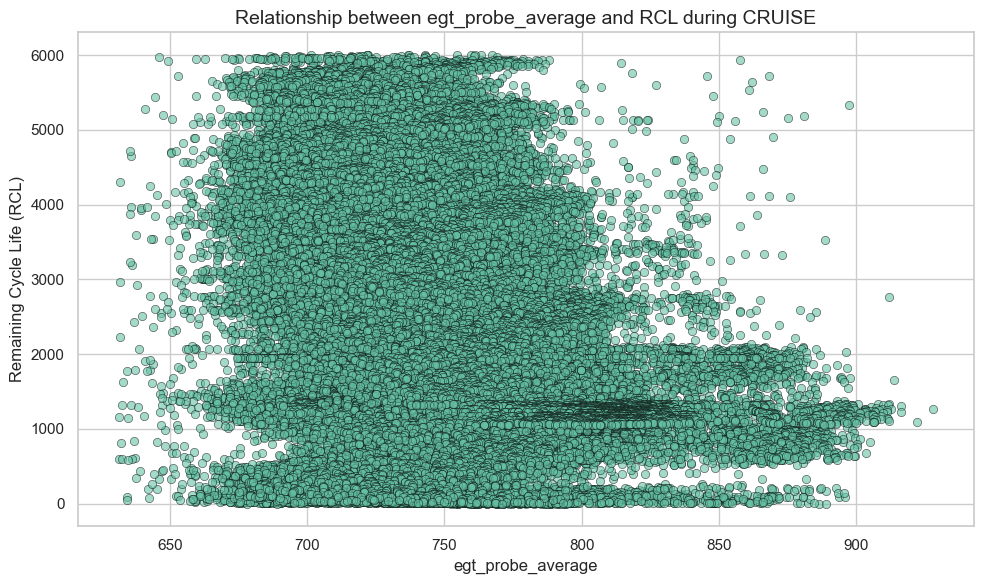

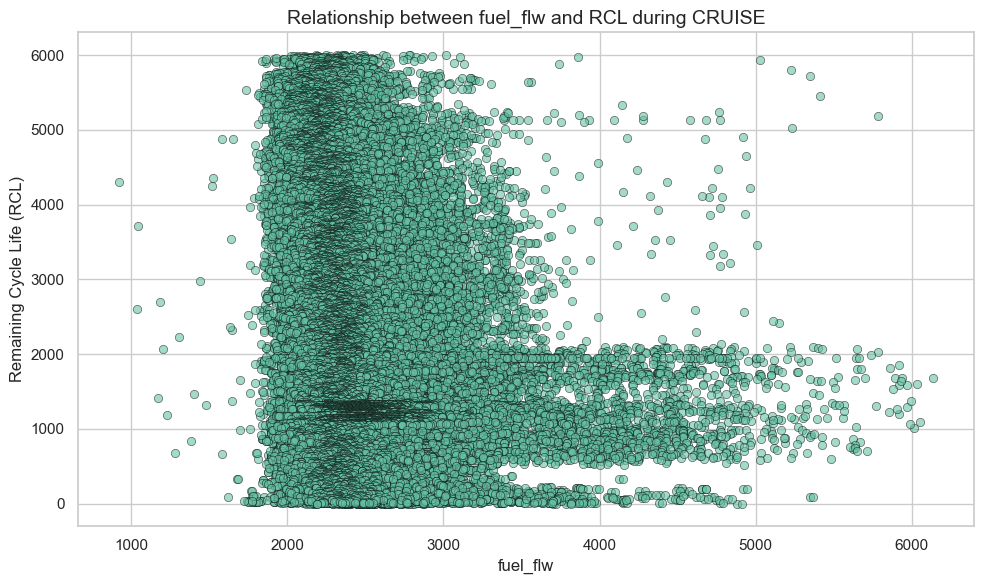

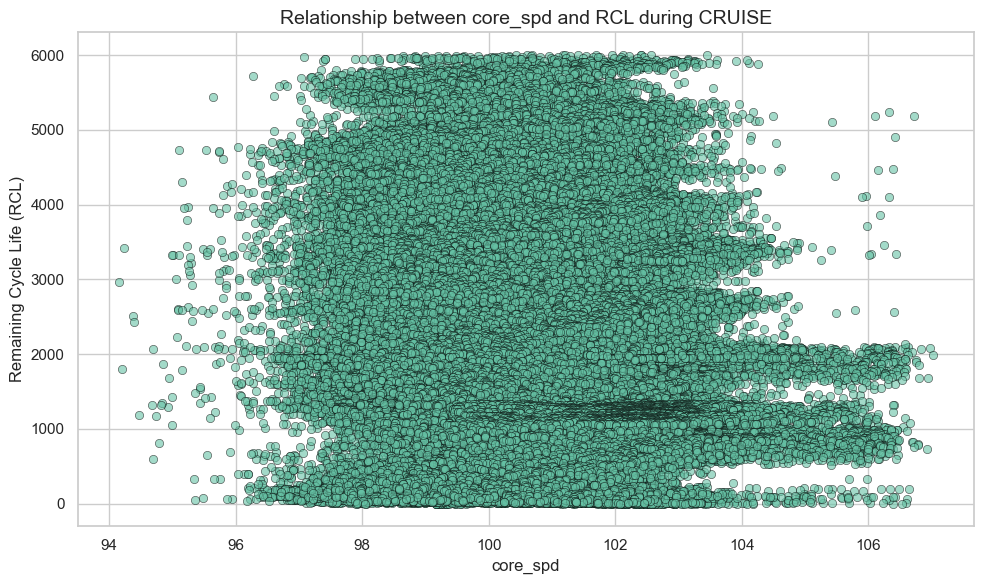

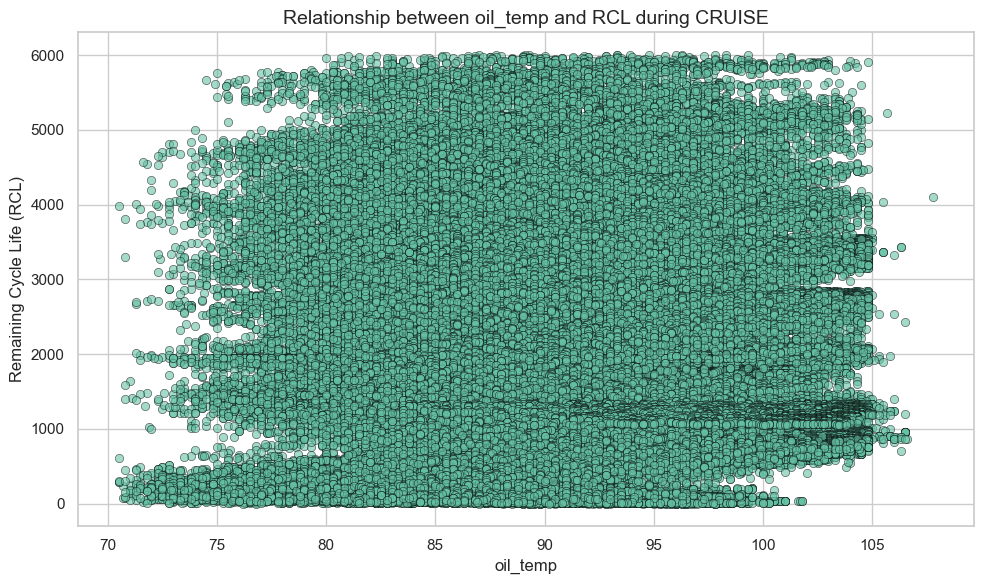

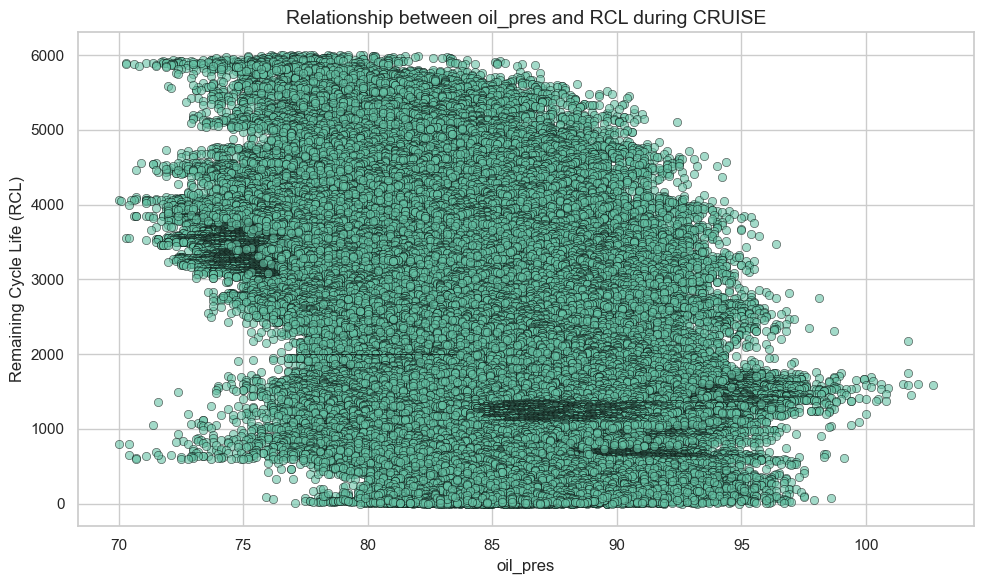

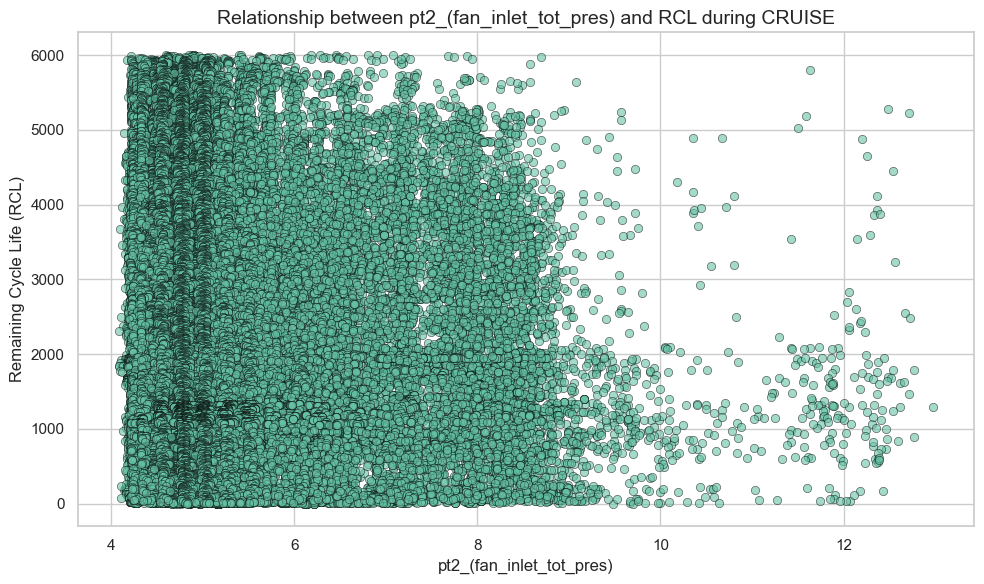

In [135]:
# Filter data for the 'CRUISE' flight phase
cruise_data = df_combined_no_outliers[df_combined_no_outliers['flight_phase'] == 'CRUISE']

# Plot the relationship between RCL and selected features during 'CRUISE'
selected_features = ['egt_probe_average', 'fuel_flw', 'core_spd', 'oil_temp', 'oil_pres', 'pt2_(fan_inlet_tot_pres)']
for feature in selected_features:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=cruise_data, x=feature, y='RCL', alpha=0.6, edgecolor='k')
    plt.title(f'Relationship between {feature} and RCL during CRUISE', fontsize=14)
    plt.xlabel(feature, fontsize=12)
    plt.ylabel('Remaining Cycle Life (RCL)', fontsize=12)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [138]:
# Calculate correlation between RCL and selected features during 'CRUISE'
correlation_with_rcl_cruise = cruise_data[selected_features + ['RCL']].corr()['RCL'].sort_values(ascending=False)
print('Correlation of features with RCL during CRUISE:')
print(correlation_with_rcl_cruise)

Correlation of features with RCL during CRUISE:
RCL                         1.000000
oil_temp                    0.014644
pt2_(fan_inlet_tot_pres)   -0.074899
core_spd                   -0.118383
fuel_flw                   -0.183943
egt_probe_average          -0.235894
oil_pres                   -0.369083
Name: RCL, dtype: float64


Mean Squared Error: 1517172.71
R-squared: 0.31


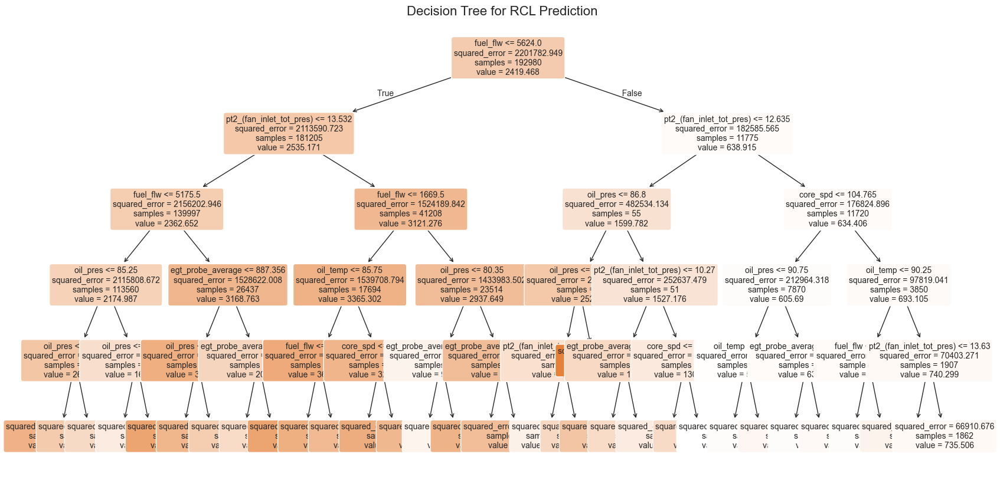

In [144]:

# Import necessary libraries for decision tree
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Prepare data
numerical_features = ['egt_probe_average', 'fuel_flw', 'core_spd', 'oil_temp', 'oil_pres', 'pt2_(fan_inlet_tot_pres)']
X = df_combined_no_outliers[numerical_features].dropna()
y = df_combined_no_outliers.loc[X.index, 'RCL']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Train a decision tree regressor
dt = DecisionTreeRegressor(max_depth=5, random_state=42)
dt.fit(X_train, y_train)

# Evaluate the model
from sklearn.metrics import mean_squared_error, r2_score
mse = mean_squared_error(y_test, dt.predict(X_test))
r2 = r2_score(y_test, dt.predict(X_test))
print(f'Mean Squared Error: {mse:.2f}')
print(f'R-squared: {r2:.2f}')

# Plot the decision tree",
plt.figure(figsize=(20, 10))
plot_tree(dt, feature_names=numerical_features, filled=True, rounded=True, fontsize=10)
plt.title('Decision Tree for RCL Prediction', fontsize=16)
plt.show()



In [141]:
#load the data
df = pd.read_csv('Data/LEAP_Engine_Data_Masked_Final_no_outliers.csv', parse_dates=['flight_datetime_c'])  # Ensure datetime parsing

# Engine By Engine features time series decomposition 

In [142]:
from statsmodels.tsa.seasonal import STL

def plot_stl_trend_by_engine(df, feature, phase, seasonal=13):
    """
    For each engine, plot the STL trend component for the given feature and flight phase.
    """
    engines = df['eng_number'].unique()
    trend_dict = {}
    plt.figure(figsize=(12, 6))
    for engine in engines:
        # Filter for the given engine and phase
        df_engine_phase = df[
            (df['eng_number'] == engine) & 
            (df['flight_phase'] == phase)
        ].copy()
        if df_engine_phase.empty:
            continue
        # Set datetime index and resample by month to obtain the average
        df_engine_phase.set_index('flight_datetime_c', inplace=True)
        df_month_avg = df_engine_phase.resample('M').mean(numeric_only=True)
        # Interpolate missing values to fill gaps
        series = df_month_avg[feature].interpolate(method='linear', limit_direction='both')
        # STL decomposition
        stl = STL(series, seasonal=seasonal)
        res = stl.fit()
        trend = res.trend
        # Save trend series for variance calculation later
        trend_dict[engine] = trend
        # Plot the trend for the current engine
        plt.plot(trend.index, trend, label=f'Engine {engine}')
        
    # Combine trends from all engines into a DataFrame
    trends_df = pd.concat(trend_dict, axis=1)
    # Compute min and max across engines for each date
    trend_min = trends_df.min(axis=1)
    trend_max = trends_df.max(axis=1)
    # Plot background shadow area representing the variance range
    plt.fill_between(trend_min.index, trend_min, trend_max, color='gray', alpha=0.3, label='Variance Range')
    plt.title(f"STL Trend - {feature} ({phase}) for All Engines")
    plt.xlabel("Date")
    plt.ylabel(feature)
    plt.legend()
    plt.tight_layout()
    plt.show()


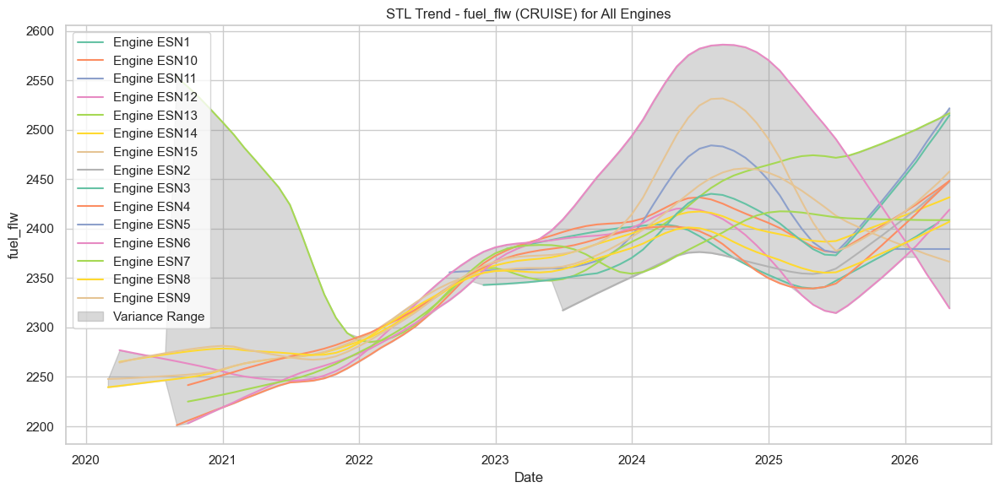

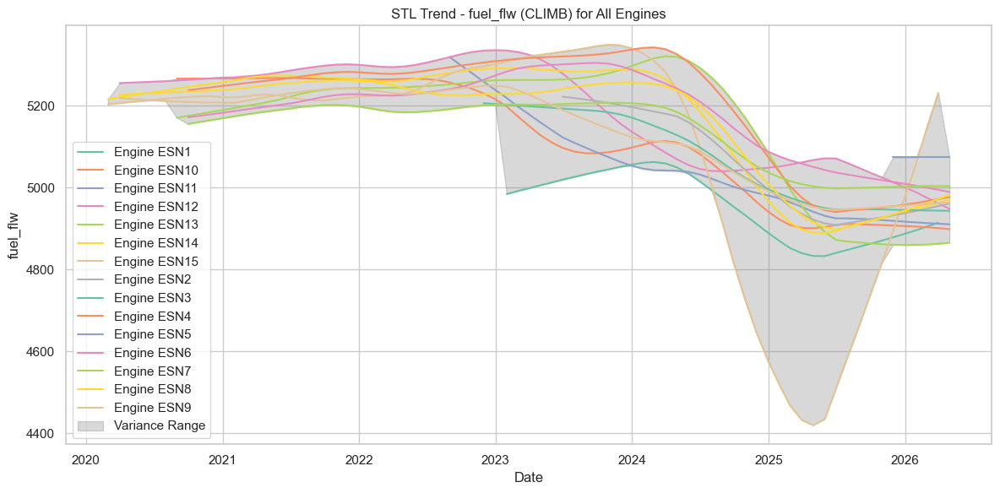

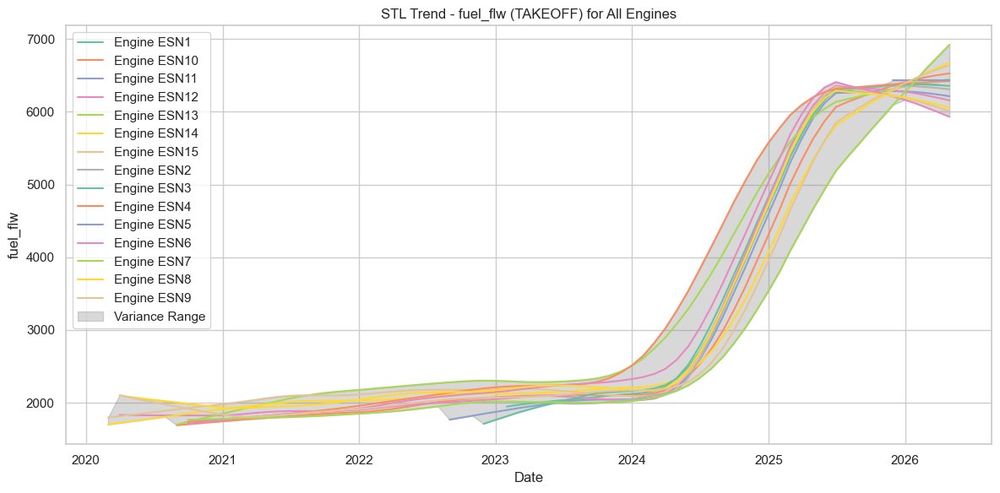

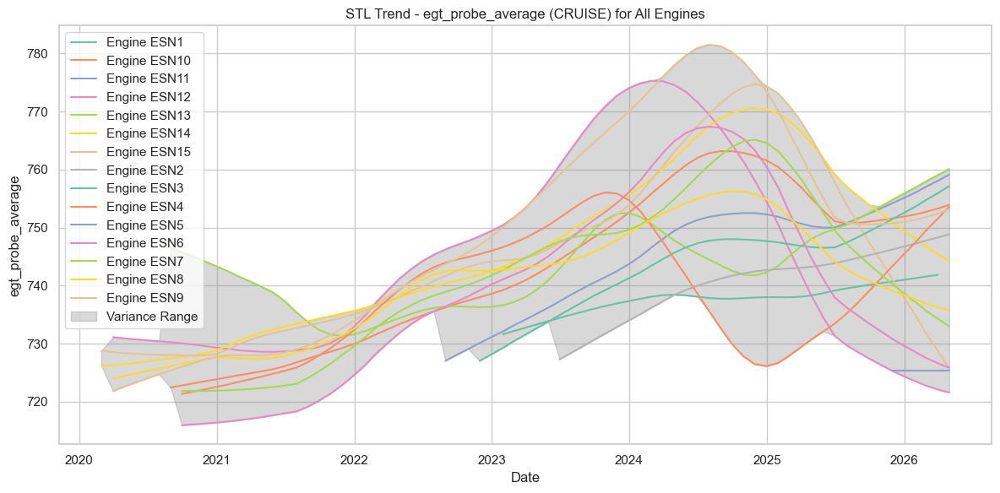

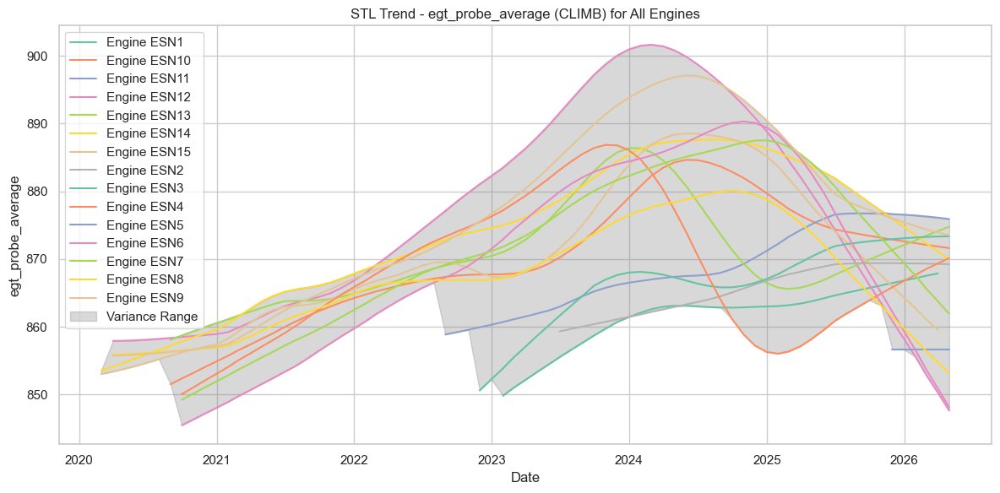

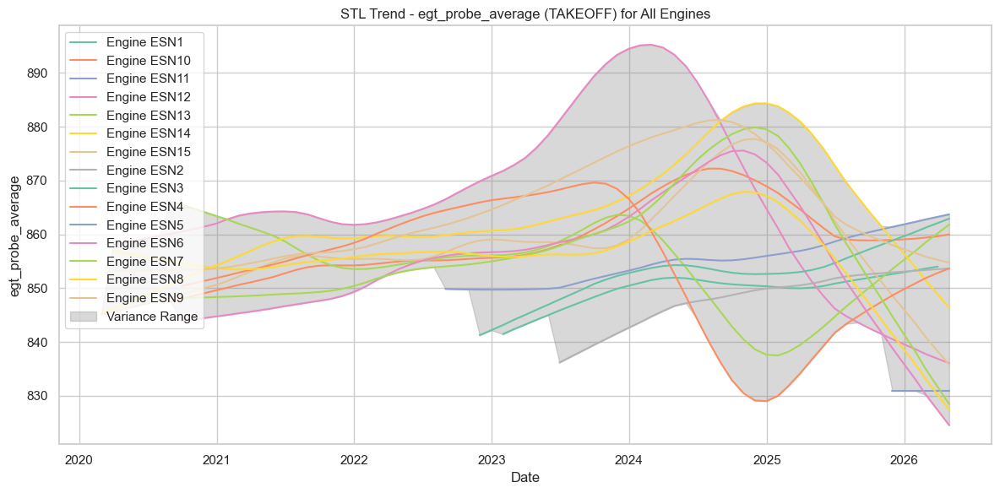

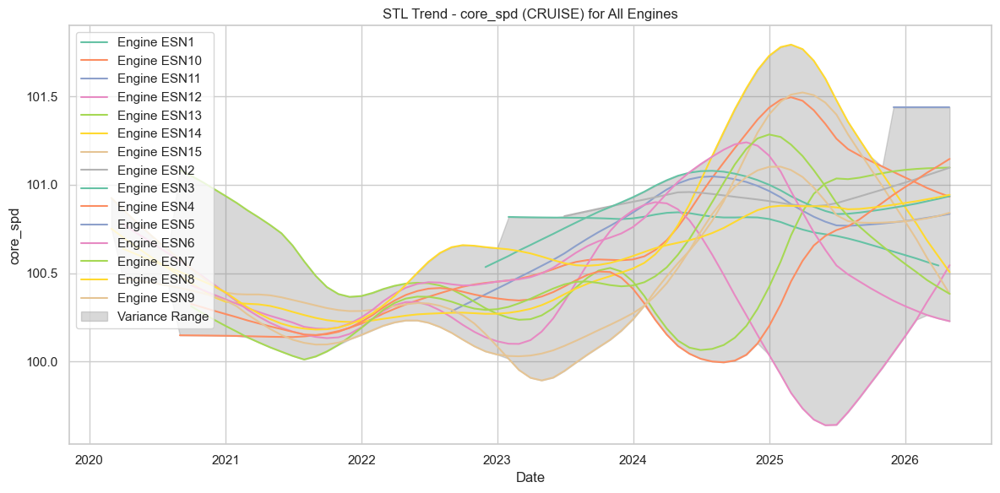

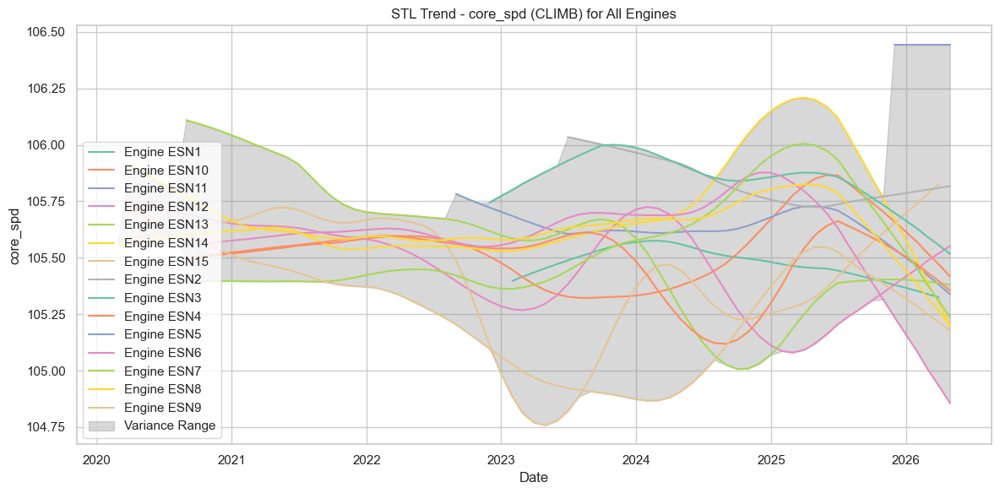

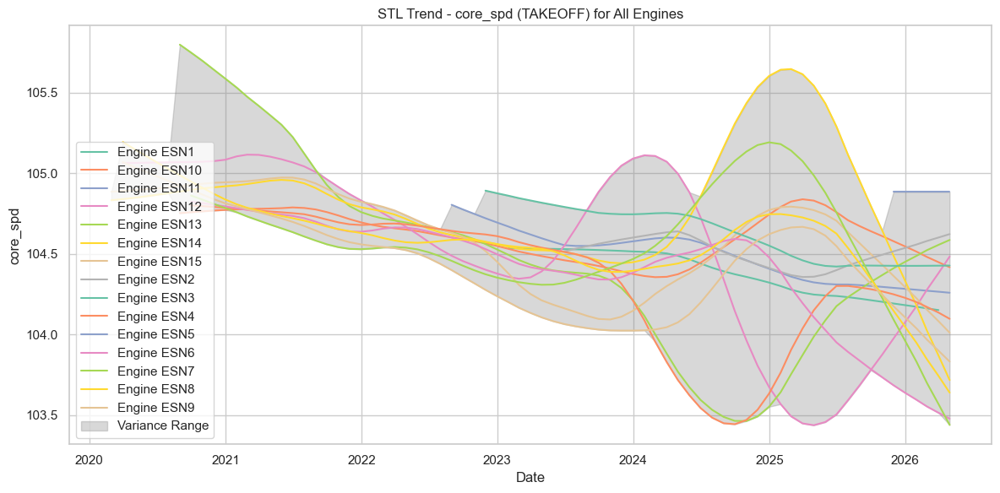

In [143]:
#use function plot_stl_trend_by_engine to polot fuel flow and egt and core speed trend for each engine for the three flight phases
for feature in ['fuel_flw', 'egt_probe_average', 'core_spd']:
    for phase in ['CRUISE', 'CLIMB', 'TAKEOFF']:
        plot_stl_trend_by_engine(df, feature, phase, seasonal=13)
        


### STL Trend Analysis Conclusion

**Fuel Flow:**
- **Cruise:** Most engines show a dip in fuel flow around 2022-2023, followed by a recovery and upward trend toward 2025-2026. There is noticeable spread between engines, with some engines consistently consuming more fuel than others.
- **Climb:** A sharp decline in fuel flow is observed from 2020 to ~2024, followed by a recovery. This suggests changing operational conditions or engine degradation patterns during climb.
- **Takeoff:** A clear and consistent upward trend across all engines from 2020 to 2026. This is a strong indicator of engine degradation, as engines require progressively more fuel to produce the same takeoff thrust over time.

**EGT Probe Average:**
- **Cruise:** EGT shows a rise from 2020 to ~2022, then a decline until ~2024, followed by another rise. This cyclical behavior may reflect seasonal effects or maintenance interventions.
- **Climb:** A pronounced peak around 2022-2023 followed by a decline. Some engines show higher EGT than others, indicating varying levels of degradation.
- **Takeoff:** Similar pattern to climb with a peak around 2022-2023 and subsequent decline, then a slight recovery. The spread between engines widens over time, suggesting divergent degradation rates.

**Core Speed:**
- **Cruise:** Core speed trends vary significantly between engines with some showing increases and others decreases. The wide variance range indicates diverse engine behavior during cruise.
- **Climb:** Relatively stable trends with minor fluctuations. The variance band is wide, suggesting engine-to-engine differences are significant.
- **Takeoff:** A general downward trend in core speed across most engines from 2020 to 2026, which combined with increasing fuel flow, supports the hypothesis of progressive engine degradation.

**Key Takeaways:**
1. **Takeoff phase is the strongest degradation indicator:** Fuel flow shows a clear upward trend while core speed shows a downward trend — classic signs of engine performance deterioration.
2. **Engines degrade at different rates:** The spread between engine trends widens over time, confirming that each engine has a unique degradation profile.
3. **EGT trends show cyclical patterns** across all phases, which may be influenced by seasonal/environmental factors or maintenance events.
4. **Climb phase** shows the most dramatic changes, likely because engines are under high stress during this phase.


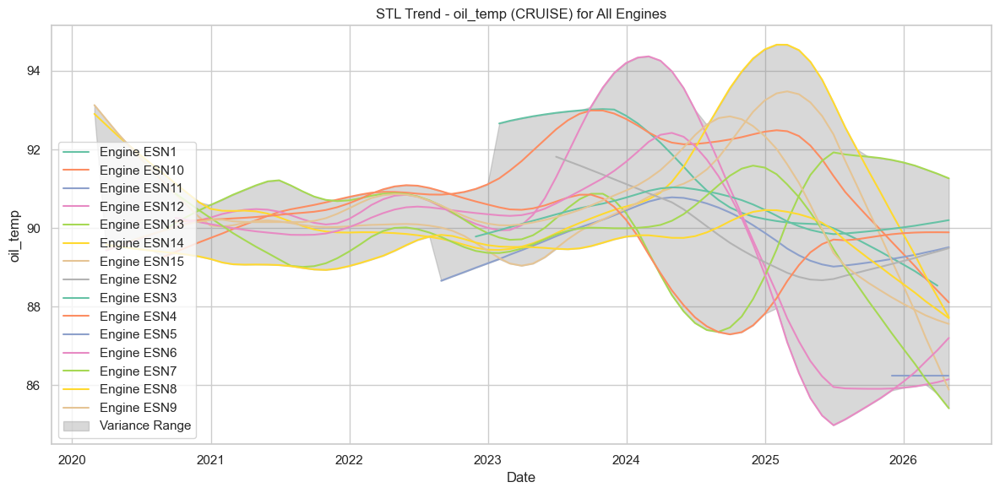

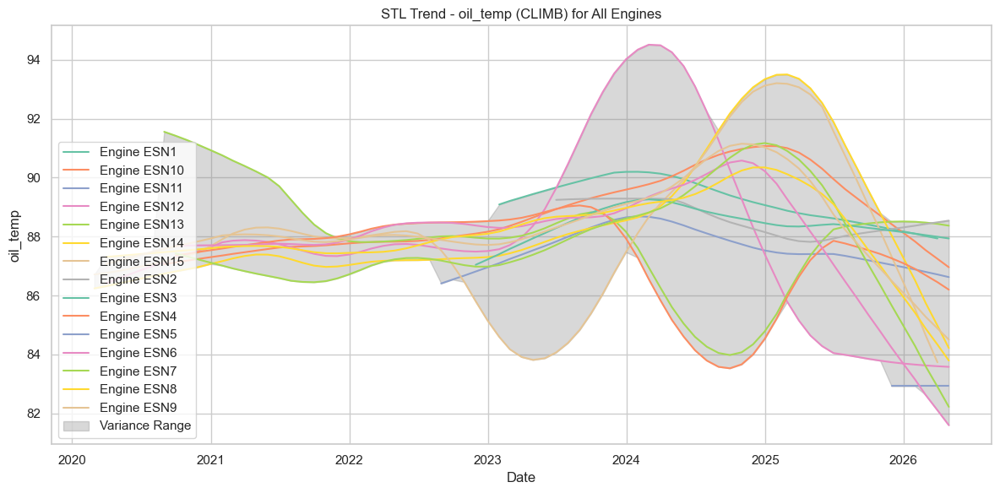

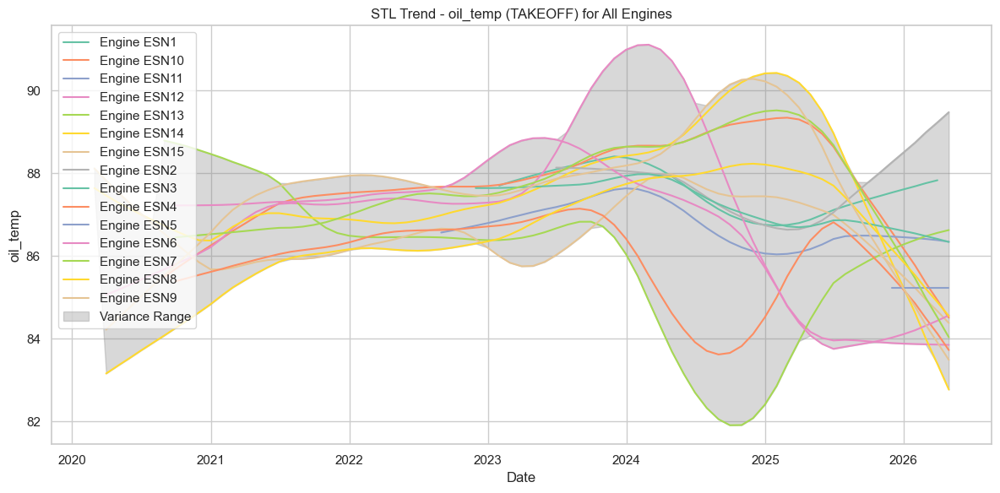

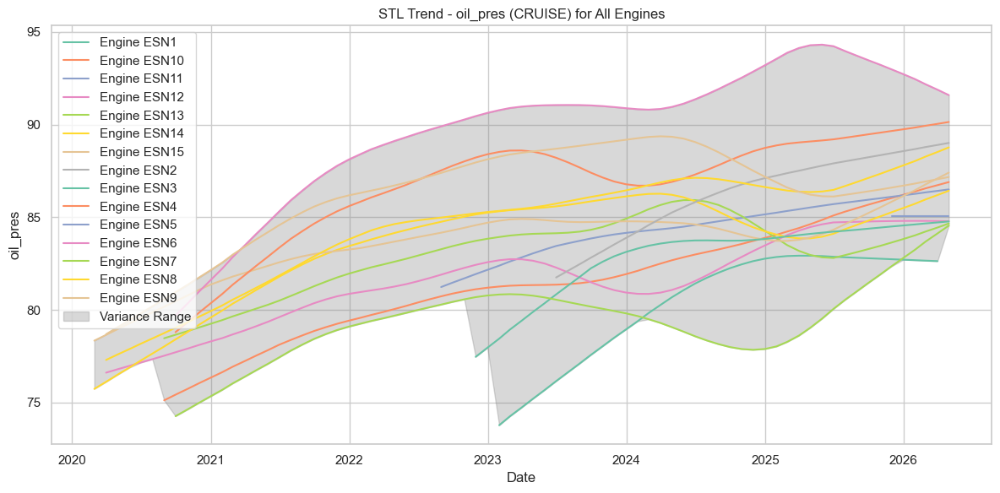

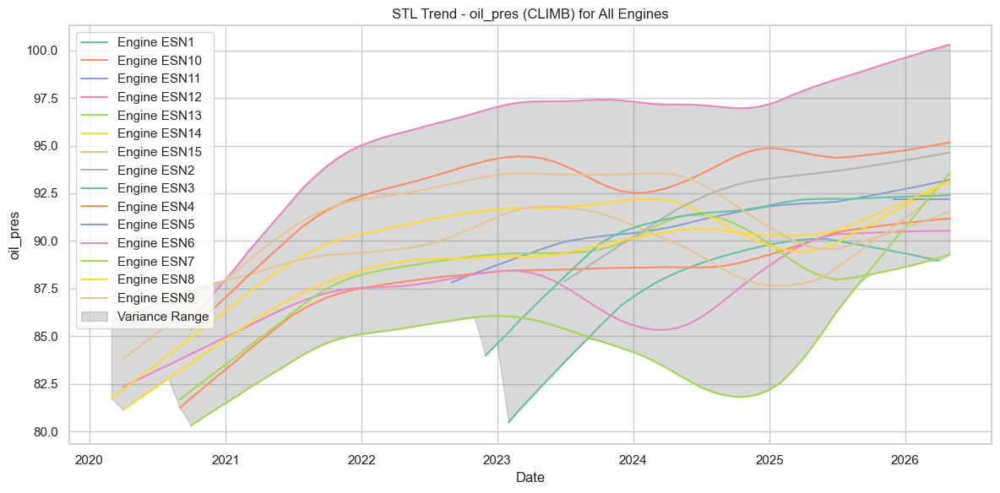

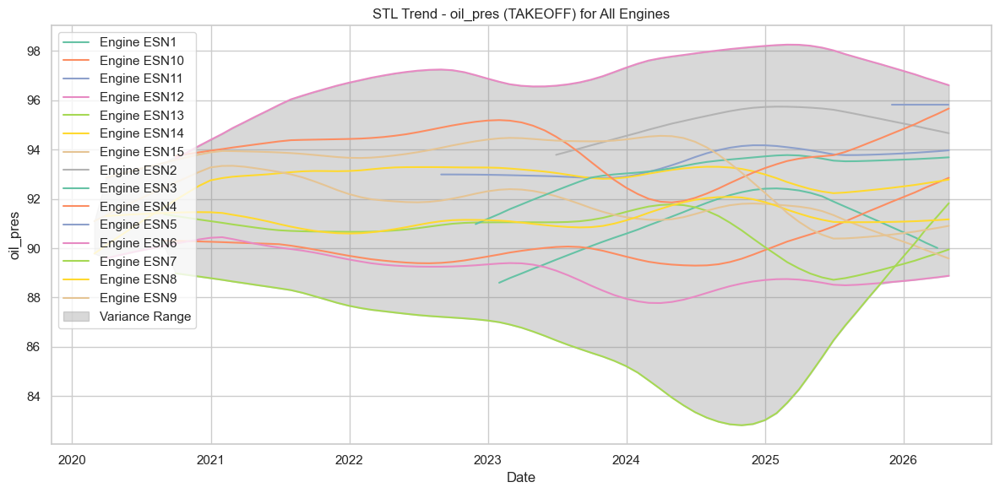

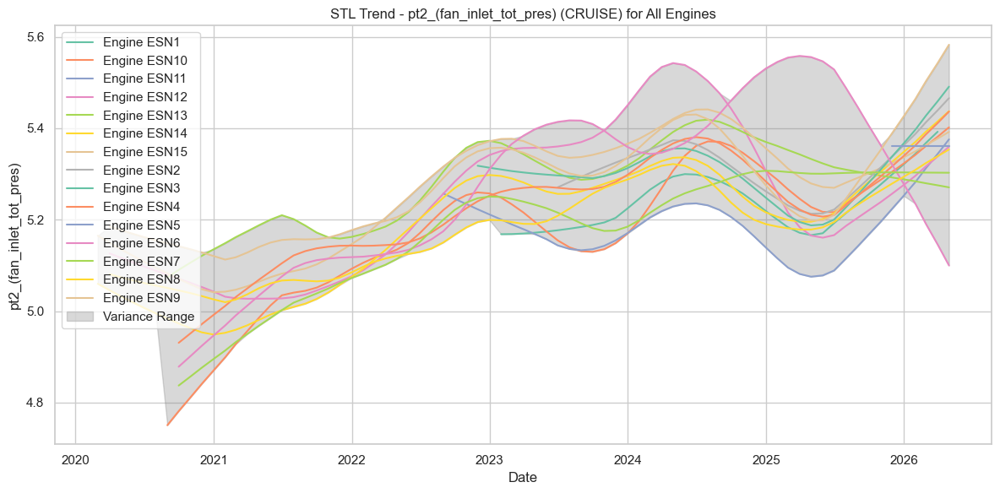

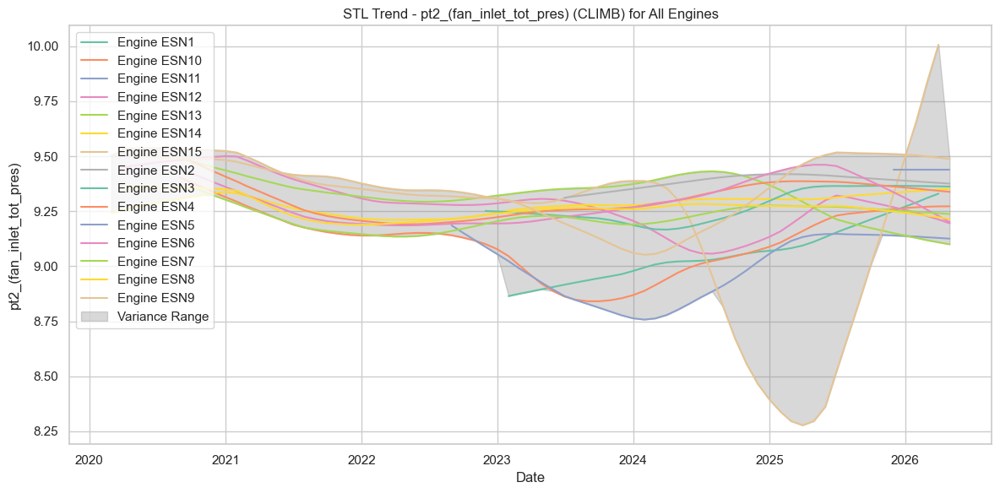

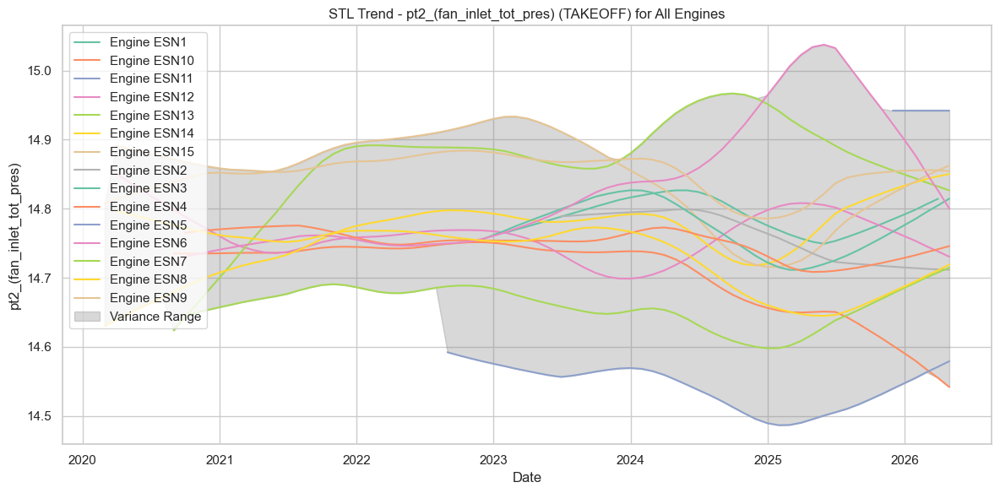

In [145]:
#use function plot_stl_trend_by_engine to polot fuel flow and egt and core speed trend for each engine for the three flight phases
for feature in ['oil_temp', 'oil_pres', 'pt2_(fan_inlet_tot_pres)']:
    for phase in ['CRUISE', 'CLIMB', 'TAKEOFF']:
        plot_stl_trend_by_engine(df, feature, phase, seasonal=13)
        


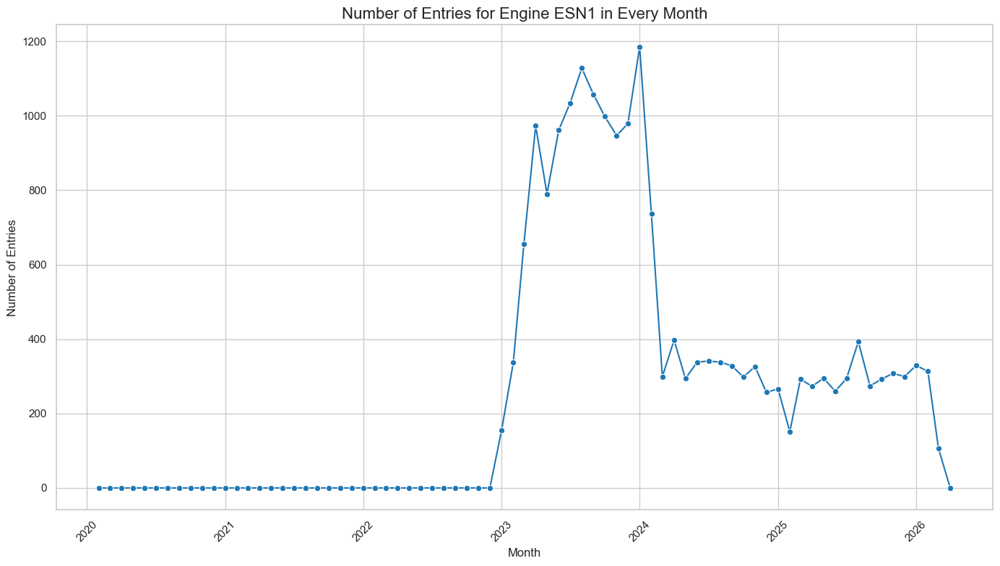

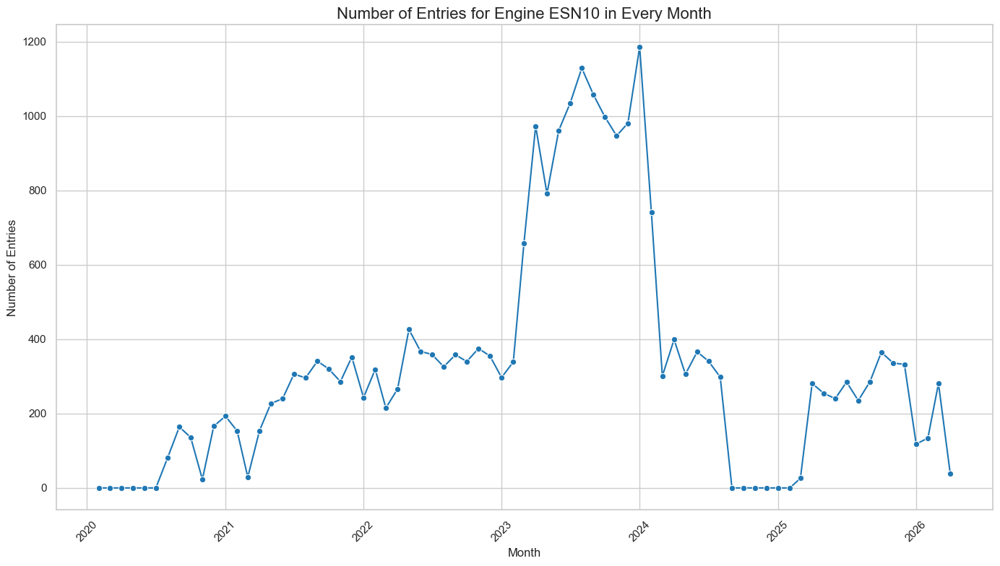

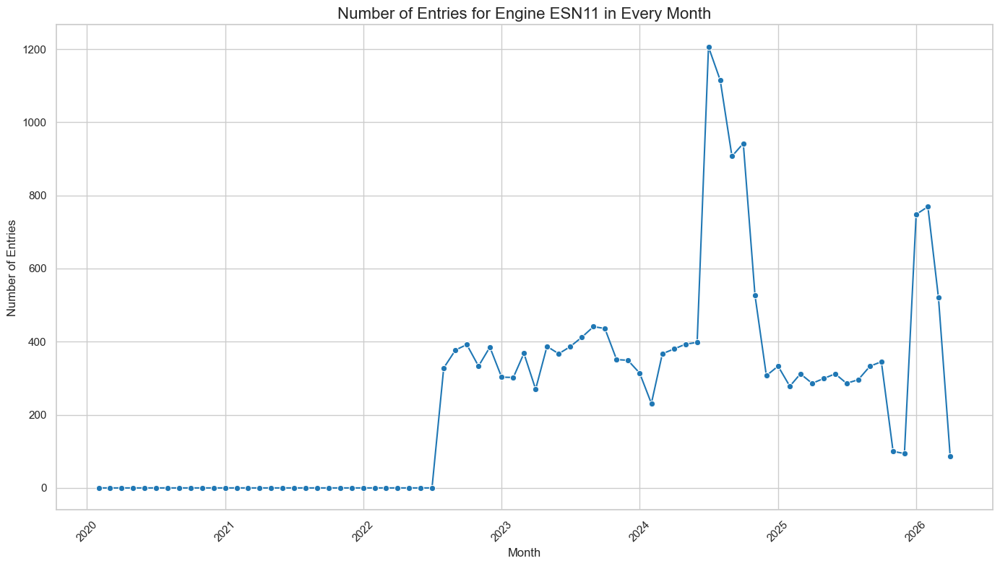

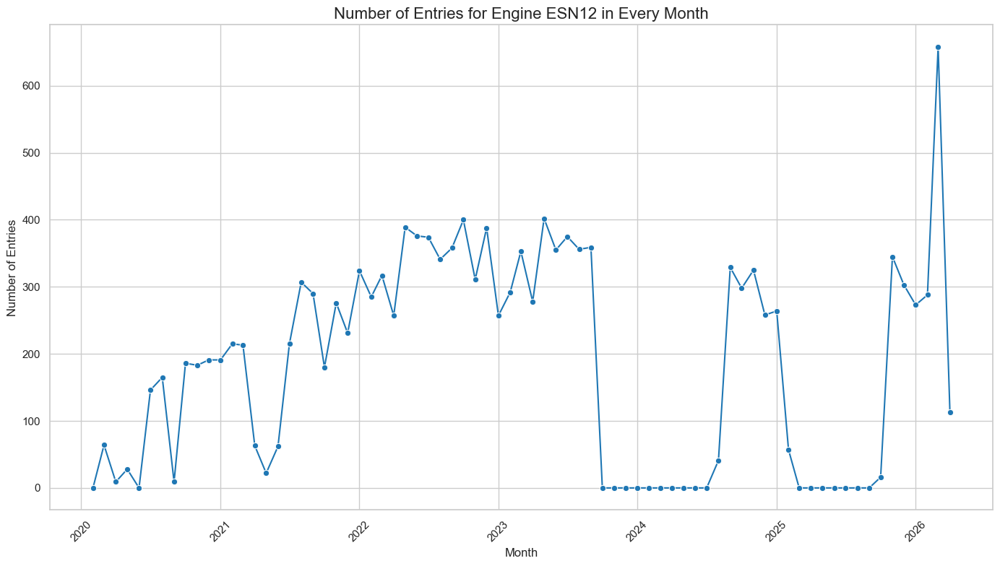

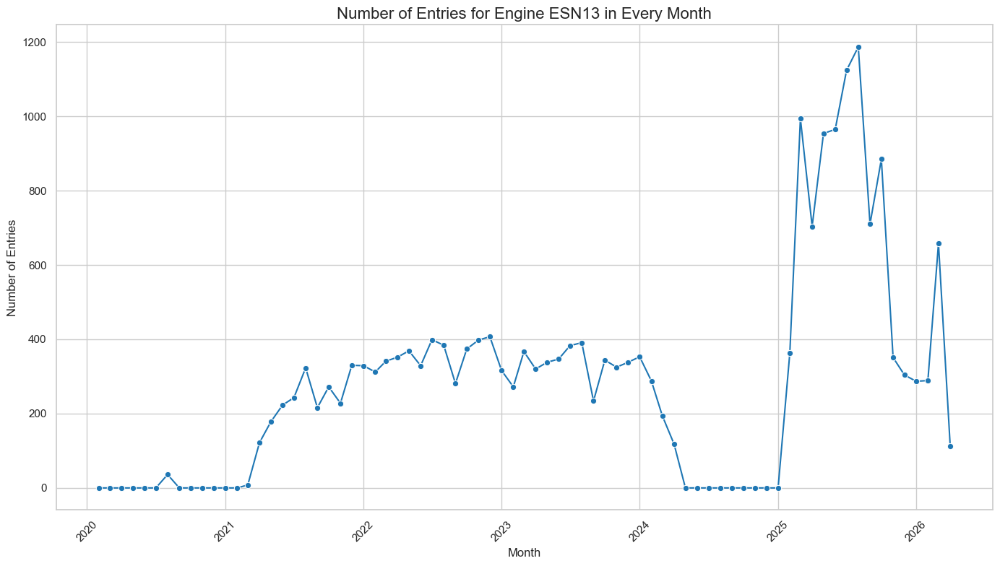

...

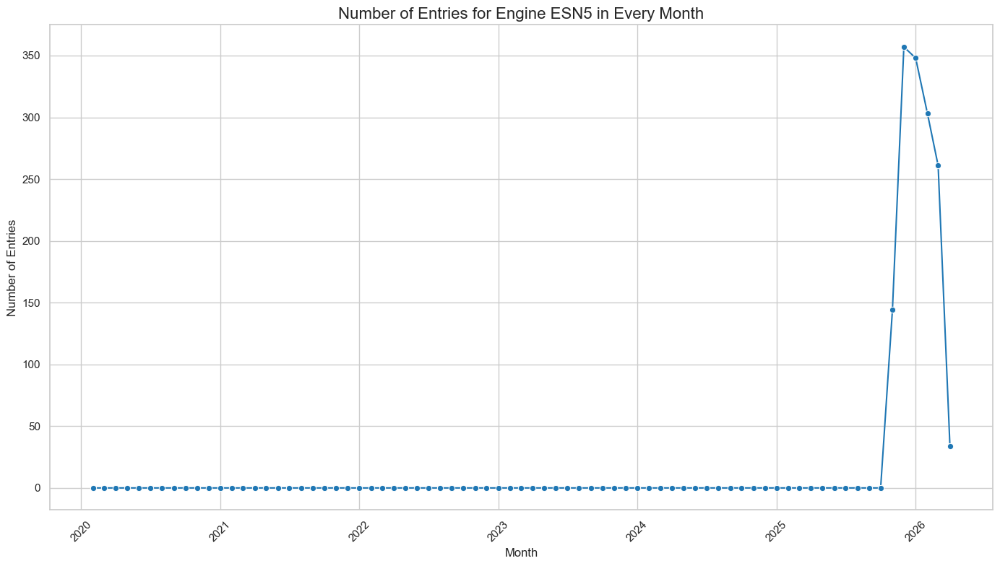

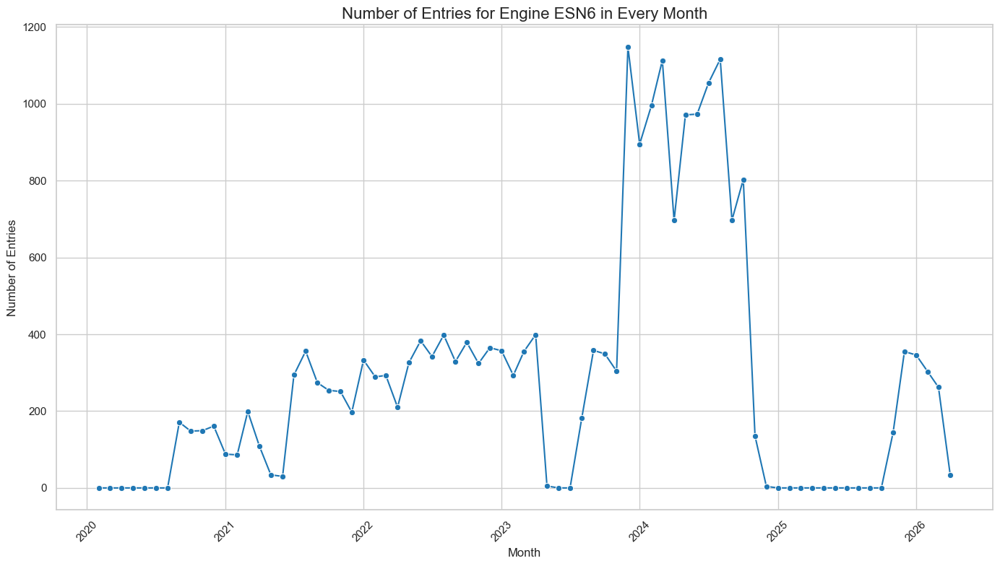

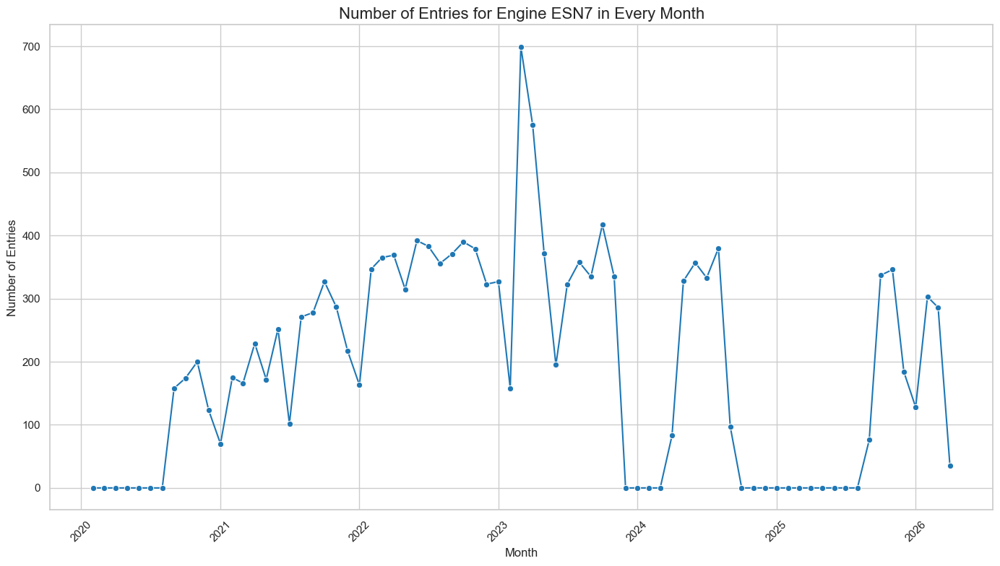

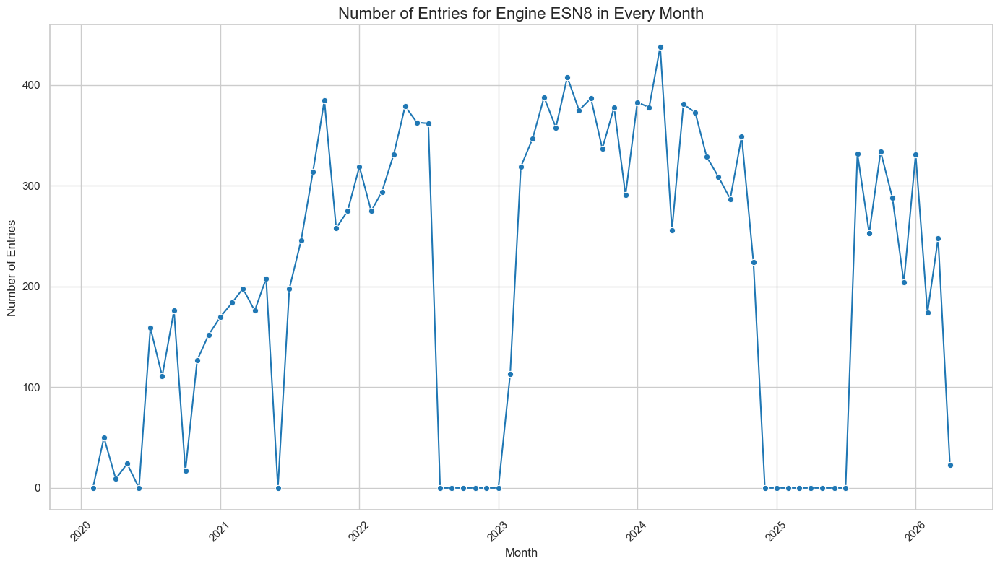

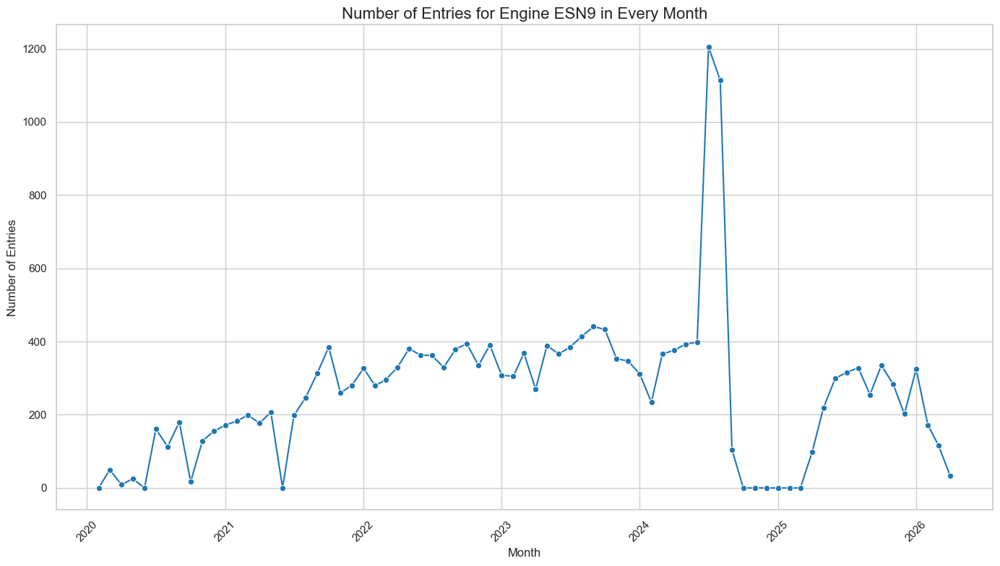

In [147]:
# Create engine_month_pivot: count of entries per engine per month
df['year_month'] = df['flight_datetime_c'].dt.to_period('M')
engine_month_pivot = df.groupby(['year_month', 'eng_number']).size().unstack(fill_value=0)
engine_month_pivot.index = engine_month_pivot.index.to_timestamp()

for engine in engine_month_pivot.columns:
    plt.figure(figsize=(14, 8))
    sns.lineplot(x=engine_month_pivot.index, y=engine_month_pivot[engine], marker='o', color='tab:blue')
    plt.title(f'Number of Entries for Engine {engine} in Every Month', fontsize=16)
    plt.xlabel('Month', fontsize=12)
    plt.ylabel('Number of Entries', fontsize=12)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()